## Prediction of Septic shock patients admitted in ICU(Intensive critical care unit.)

Sepsis is a serious condition in which the body responds improperly to an infection. 
The infection-fighting processes turn on the body, causing the organs to work poorly. 
Sepsis may progress to septic shock. This is a dramatic drop in blood pressure that 
can damage the lungs, kidneys, liver and other organs. When the damage is severe, 
it can lead to mortality.

Sepsis is a clinical syndrome of life-threatening organ dysfunction caused by 
a dysregulated response to infection. In septic shock, there is critical reduction 
in tissue perfusion; acute failure of multiple organs, including the lungs, kidneys, 
and liver, can occur.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

from sklearn.feature_selection import SelectKBest, mutual_info_classif
#from sklearn.feature_selection importchi2, f_classif, 
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedShuffleSplit, cross_validate
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, precision_recall_curve, f1_score

from imblearn.over_sampling import SMOTE,ADASYN,RandomOverSampler,BorderlineSMOTE,SVMSMOTE
from imblearn.under_sampling import RandomUnderSampler










In [2]:
#Setting the max number of columns, rows and the col_width to be displayed
pd.set_option('display.max_columns',200)
pd.set_option('display.max_rows',200)
pd.set_option('display.max_colwidth',312)

In [3]:
df = pd.read_csv(r"C:\Users\Dell\Desktop\DATA SCIENCE\project class\datasets\18th nov\sepsis_status.csv")
dic = pd.read_csv(r"C:\Users\Dell\Desktop\DATA SCIENCE\project class\datasets\18th nov\Parameter _detail_Dictionary.csv")

In [4]:
# Making a copy of the original dataset
df_cp = df.copy()
df_cp.head()

,encounter_id,patient_id,hospital_id,septic_shock,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_invasive_max,d1_mbp_invasive_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_invasive_max,d1_sysbp_invasive_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_invasive_max,h1_mbp_invasive_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_invasive_max,h1_sysbp_invasive_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_albumin_max,h1_albumin_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_glucose_max,h1_glucose_min,h1_hco3_max,h1_hco3_min,h1_hemaglobin_max,h1_hemaglobin_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,apache_4a_hospital_sepsis_prob,apache_4a_icu_sepsis_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.73,0,Caucasian,M,180.3,Floor,Floor,92,admit,CTICU,0.541667,0,73.9,2.3,113.0,502.01,0,0.0,0.4,31.0,2.51,NaN,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0.0,40.0,NaN,NaN,NaN,NaN,36.0,134.0,39.3,NaN,0.0,14.1,46.0,32.0,68.0,37.0,68.0,37.0,119.0,72.0,66.0,40.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,122.0,64.0,131.0,73.0,131.0,73.0,39.9,37.2,NaN,NaN,68.0,63.0,68.0,63.0,119.0,108.0,NaN,NaN,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,NaN,NaN,131.0,115.0,131.0,115.0,39.5,37.5,2.3,2.3,0.4,0.4,31.0,30.0,8.5,7.4,2.51,2.23,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,NaN,NaN,1.3,1.0,233.0,233.0,4.0,3.4,136.0,134.0,14.1,14.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.10,0.05,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.42,0,Caucasian,F,160.0,Floor,Floor,90,admit,Med-Surg ICU,0.927778,0,70.2,NaN,1

In [5]:
#Basic info about the data
df_cp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91713 entries, 0 to 91712
Columns: 186 entries, encounter_id to apache_2_bodysystem
dtypes: float64(170), int64(8), object(8)
memory usage: 130.1+ MB


In [6]:
df_cp['septic_shock'].value_counts(normalize=True) #We can see the data is imbalanced

0    0.913698
1    0.086302
Name: septic_shock, dtype: float64

In [7]:
# Description of each variable in the datset
dic

,Category,Variable Name,Unit of Measure,Data Type,Description,Example
0,identifier,encounter_id,None,integer,Unique identifier associated with a patient unit stay,None
1,identifier,hospital_id,None,integer,Unique identifier associated with a hospital,None
2,identifier,patient_id,None,integer,Unique identifier associated with a patient,None
3,demographic,Sepsis_status,None,binary,Whether the patient having sepsis during this hospitalization,0
4,demographic,age,Years,numeric,The age of the patient on unit admission,None
5,demographic,bmi,kilograms/metres^2,string,The body mass index of the person on unit admission,21.5
6,demographic,elective_surgery,None,binary,Whether the patient was admitted to the hospital for an elective surgical operation,0
7,demographic,ethnicity,None,string,The common national or cultural tradition which the person belongs to,Caucasian
8,demographic,gender,None,string,The genotypical sex of the patient,F
9,demographic,height,centimetres,numeric,The height of the person on unit admission,180


In [8]:
#These are the different types of Category that our variables fall under
dic.Category.unique()

array(['identifier', 'demographic', 'APACHE covariate', 'vitals', 'labs',
       'labs blood gas', 'APACHE prediction', 'APACHE comorbidity',
       'APACHE grouping', 'GOSSIS example prediction'], dtype=object)

In [9]:
#Defining a function to look up the description of the category/variable we want.
def select_category_from_dic(df,cat):
    return df[df['Category']==cat]

In [10]:
#The variables that falls under 'identifier'category and their description
select_category_from_dic(dic,'identifier')

,Category,Variable Name,Unit of Measure,Data Type,Description,Example
0,identifier,encounter_id,None,integer,Unique identifier associated with a patient unit stay,None
1,identifier,hospital_id,None,integer,Unique identifier associated with a hospital,None
2,identifier,patient_id,None,integer,Unique identifier associated with a patient,None


In [11]:
#The variables that falls under 'APACHE covariate'category and their description
select_category_from_dic(dic,'APACHE covariate')

,Category,Variable Name,Unit of Measure,Data Type,Description,Example
19,APACHE covariate,albumin_apache,g/L,numeric,The albumin concentration measured during the first 24 hours which results in the highest APACHE III score,30
20,APACHE covariate,apache_2_diagnosis,None,string,The APACHE II diagnosis for the ICU admission,308
21,APACHE covariate,apache_3j_diagnosis,None,string,The APACHE III-J sub-diagnosis code which best describes the reason for the ICU admission,1405
22,APACHE covariate,apache_post_operative,None,binary,"The APACHE operative status; 1 for post-operative, 0 for non-operative",1
23,APACHE covariate,arf_apache,None,binary,"Whether the patient had acute renal failure during the first 24 hours of their unit stay, defined as a 24 hour urine output <410ml, creatinine >=133 micromol/L and no chronic dialysis",0
24,APACHE covariate,bilirubin_apache,micromol/L,numeric,The bilirubin concentration measured during the first 24 hours which results in the highest APACHE III score,20
25,APACHE covariate,bun_apache,mmol/L,numeric,The blood urea nitrogen concentration measured during the first 24 hours which results in the highest APACHE III score,None
26,APACHE covariate,creatinine_apache,micromol/L,numeric,The creatinine concentration measured during the first 24 hours which results in the highest APACHE III score,70
27,APACHE covariate,fio2_apache,Fraction,numeric,The fraction of inspired oxygen from the arterial blood gas taken during the first 24 hours of unit admission which produces the highest APACHE III score for oxygenation,0.21
28,APACHE covariate,gcs_eyes_apache,None,integer,The eye opening component of the Glasgow Coma Scale measured during the first 24 hours which results in the highest APACHE III score,4


In [12]:
#Pre-processing first step: Checking for null values

In [13]:

df_cp.isnull().sum()

encounter_id                          0
patient_id                            0
hospital_id                           0
septic_shock                          0
age                                4228
bmi                                3429
elective_surgery                      0
ethnicity                          1395
gender                               25
height                             1334
hospital_admit_source             21409
icu_admit_source                    112
icu_id                                0
icu_stay_type                         0
icu_type                              0
pre_icu_los_days                      0
readmission_status                    0
weight                             2720
albumin_apache                    54379
apache_2_diagnosis                 1662
apache_3j_diagnosis                1101
apache_post_operative                 0
arf_apache                          715
bilirubin_apache                  58134
bun_apache                        19262


In [14]:
#Seeing the percentage of null values for each column
null_per = df_cp.isnull().sum()/len(df_cp)*100
null_per.sort_values(ascending=False)

h1_bilirubin_min                  92.265001
h1_bilirubin_max                  92.265001
h1_lactate_max                    91.992411
h1_lactate_min                    91.992411
h1_albumin_max                    91.398166
h1_albumin_min                    91.398166
h1_pao2fio2ratio_min              87.441257
h1_pao2fio2ratio_max              87.441257
h1_arterial_ph_max                83.329517
h1_arterial_ph_min                83.329517
h1_hco3_max                       82.969699
h1_hco3_min                       82.969699
h1_arterial_pco2_min              82.822501
h1_arterial_pco2_max              82.822501
h1_wbc_max                        82.815958
h1_wbc_min                        82.815958
h1_arterial_po2_max               82.807236
h1_arterial_po2_min               82.807236
h1_calcium_max                    82.717826
h1_calcium_min                    82.717826
h1_platelets_max                  82.510658
h1_platelets_min                  82.510658
h1_bun_max                      

In [15]:
#Most of the features has more than 50% of null values and some has less than 25%.
#There is no feature with 25-50% null values
#Since it is based on a critical/ healthcare domain, we couldn't just impute the missing values

In [16]:
high_miss_cols = null_per[null_per>50].index
high_miss_cols

Index(['albumin_apache', 'bilirubin_apache', 'fio2_apache', 'paco2_apache',
       'paco2_for_ph_apache', 'pao2_apache', 'ph_apache', 'urineoutput_apache',
       'd1_diasbp_invasive_max', 'd1_diasbp_invasive_min',
       'd1_mbp_invasive_max', 'd1_mbp_invasive_min', 'd1_sysbp_invasive_max',
       'd1_sysbp_invasive_min', 'h1_diasbp_invasive_max',
       'h1_diasbp_invasive_min', 'h1_mbp_invasive_max', 'h1_mbp_invasive_min',
       'h1_sysbp_invasive_max', 'h1_sysbp_invasive_min', 'd1_albumin_max',
       'd1_albumin_min', 'd1_bilirubin_max', 'd1_bilirubin_min', 'd1_inr_max',
       'd1_inr_min', 'd1_lactate_max', 'd1_lactate_min', 'h1_albumin_max',
       'h1_albumin_min', 'h1_bilirubin_max', 'h1_bilirubin_min', 'h1_bun_max',
       'h1_bun_min', 'h1_calcium_max', 'h1_calcium_min', 'h1_creatinine_max',
       'h1_creatinine_min', 'h1_glucose_max', 'h1_glucose_min', 'h1_hco3_max',
       'h1_hco3_min', 'h1_hemaglobin_max', 'h1_hemaglobin_min',
       'h1_hematocrit_max', 'h1_hematocri

In [17]:
#Dropping the columns with more than 50%
df_icu = df_cp.drop(high_miss_cols,axis=1)

In [18]:
df_icu.shape #112 features are there after dropping the columns with more than 50% null values

(91713, 112)

In [19]:
#Handling the remaining null values by dropping the record with null values
df_icu_1 = df_icu.dropna()

In [20]:
#Dropped the rows with null values. Since it is medical based, we can't do much rather than dropping it.
df_icu_1.shape

(27795, 112)

In [21]:
df_icu_1.isnull().sum().sum() #Now,There are no nul values in our dataset

0

In [22]:
df_icu_1.head()

,encounter_id,patient_id,hospital_id,septic_shock,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,apache_4a_hospital_sepsis_prob,apache_4a_icu_sepsis_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.730000,0,Caucasian,M,180.3,Floor,Floor,92,admit,CTICU,0.541667,0,73.9,113.0,502.01,0,0.0,31.0,2.51,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0.0,40.0,36.0,134.0,39.3,0.0,14.1,68.0,37.0,68.0,37.0,119.0,72.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,131.0,73.0,131.0,73.0,39.9,37.2,68.0,63.0,68.0,63.0,119.0,108.0,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,131.0,115.0,131.0,115.0,39.5,37.5,31.0,30.0,8.5,7.4,2.51,2.23,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,233.0,233.0,4.0,3.4,136.0,134.0,14.1,14.1,0.10,0.05,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.420000,0,Caucasian,F,160.0,Floor,Floor,90,admit,Med-Surg ICU,0.927778,0,70.2,108.0,203.01,0,0.0,9.0,0.56,1.0,3.0,0.0,1.0,145.0,120.0,36.9,0.0,46.0,33.0,145.0,35.1,1.0,12.7,95.0,31.0,95.0,31.0,118.0,72.0,120.0,38.0,120.0,38.0,32.0,12.0,100.0,70.0,159.0,67.0,159.0,67.0,36.3,35.1,61.0,48.0,61.0,48.0,114.0,100.0,85.0,57.0,85.0,57.0,31.0,28.0,95.0,70.0,95.0,71.0,95.0,71.0,36.3,36.3,11.0,9.0,8.6,8.0,0.71,0.56,145.0,128.0,27.0,26.0,11.3,11.1,36.9,36.1,557.0,487.0,4.2,3.8,145.0,145.0,23.3,12.7,0.47,0.29,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
5,33181,74489,83,0,67.0,27.560000,0,Caucasian,M,190.5,Direct Admit,Accident & Emergency,95,admit,Med-Surg ICU,0.000694,0,100.0,301.0,403.01,0,0.0,13.0,0.71,4.0,6.0,0.0,5.0,156.0,113.0,44.2,0.0,130.0,35.0,137.0,36.6,0.0,10.9,100.0,61.0,100.0,61.0,113.0,83.0,127.0,80.0,127.0,80.0,32.0,10.0,97.0,91.0,173.0,107.0,173.0,107.0,36.8,36.6,89.0,89.0,89.0,89.0,83.0,83.0,111.0,111.0,111.0,111.0,12.0,12.0,97.0,97.0,143.0,143.0,143.0,143.0,36.7,36.7,13.0,13.0,8.8,8.8,0.71,0.71,156.0,125.0,27.0,27.0,15.6,15.6,44.2,44.2,159.0,159.0,3.9,3.7,137.0,137.0,10.9,10.9,0.05,0.02,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Neurological,Neurologic
17,22471,112115,118,0,46.0,25.845717,0,Hispanic,M,167.6,Emergency Department,Accident & Emergency,92,admit,CTICU,0.000000,0,72.6,108.0,203.01,0,0.0,15.0,1.00,1.0,4.0,0.0,1.0,143.0,114.0,44.2,1.0,113.0,34.0,132.0,36.4,1.0,9.7,89.0,61.0,89.0,61.0,98.0,64.0,113.0,76.0,113.0,76.0,22.0,9.0,100.0,88.0,169.0,102.0,169.0,102.0,37.1,36.4,89.0,63.0,89.0,63.0,94.0,80.0,104.0,88.0,104.0,88.0,21.0,9.0,99.0,95.0,169.0,115.0,169.0,115.0,36.6,36.6,15.0,15.0,8.5,8.5,1.00,1.00,143

In [23]:
dic[dic['Variable Name'] == 'icu_id']

,Category,Variable Name,Unit of Measure,Data Type,Description,Example
13,demographic,icu_id,None,integer,A unique identifier for the unit to which the patient was admitted,None


In [24]:
select_category_from_dic(dic,'demographic')

,Category,Variable Name,Unit of Measure,Data Type,Description,Example
3,demographic,Sepsis_status,None,binary,Whether the patient having sepsis during this hospitalization,0
4,demographic,age,Years,numeric,The age of the patient on unit admission,None
5,demographic,bmi,kilograms/metres^2,string,The body mass index of the person on unit admission,21.5
6,demographic,elective_surgery,None,binary,Whether the patient was admitted to the hospital for an elective surgical operation,0
7,demographic,ethnicity,None,string,The common national or cultural tradition which the person belongs to,Caucasian
8,demographic,gender,None,string,The genotypical sex of the patient,F
9,demographic,height,centimetres,numeric,The height of the person on unit admission,180
10,demographic,hospital_admit_source,None,string,The location of the patient prior to being admitted to the hospital,Home
11,demographic,icu_admit_source,None,string,The location of the patient prior to being admitted to the unit,Operating room
12,demographic,icu_admit_type,None,string,The type of unit admission for the patient,Cardiothoracic


In [25]:
#Lets drop some features that has not much significance as per our understanding.
cols_to_drop = ['encounter_id','patient_id','hospital_admit_source','icu_admit_source','icu_id','icu_stay_type']

In [26]:
#Not dropping the hospital_id since it might have some information.
df_icu_1 = df_icu_1.drop(cols_to_drop,axis=1)

In [27]:
df_icu_1.shape

(27795, 106)

In [28]:
df_icu_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27795 entries, 0 to 91709
Columns: 106 entries, hospital_id to apache_2_bodysystem
dtypes: float64(96), int64(5), object(5)
memory usage: 22.7+ MB


In [29]:
#We can see float, int and object dtypes present

In [30]:
#Geting the columns with object dtype 
object_cols = df_icu_1.select_dtypes(include='object').columns
object_cols

Index(['ethnicity', 'gender', 'icu_type', 'apache_3j_bodysystem',
       'apache_2_bodysystem'],
      dtype='object')

In [31]:
#Encoding our categorical features
df_icu_1_final = pd.get_dummies(df_icu_1,columns=object_cols,drop_first=True)

In [32]:
df_icu_1_final.head()

,hospital_id,septic_shock,age,bmi,elective_surgery,height,pre_icu_los_days,readmission_status,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,apache_4a_hospital_sepsis_prob,apache_4a_icu_sepsis_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,gender_M,icu_type_CSICU,icu_type_CTICU,icu_type_Cardiac ICU,icu_type_MICU,icu_type_Med-Surg ICU,icu_type_Neuro ICU,icu_type_SICU,apache_3j_bodysystem_Gastrointestinal,apache_3j_bodysystem_Genitourinary,apache_3j_bodysystem_Gynecological,apache_3j_bodysystem_Hematological,apache_3j_bodysystem_Metabolic,apache_3j_bodysystem_Musculoskeletal/Skin,apache_3j_bodysystem_Neurological,apache_3j_bodysystem_Respiratory,apache_3j_bodysystem_Sepsis,apache_3j_bodysystem_Trauma,apache_2_bodysystem_Gastrointestinal,apache_2_bodysystem_Haematologic,apache_2_bodysystem_Metabolic,apache_2_bodysystem_Neurologic,apache_2_bodysystem_Renal/Genitourinary,apache_2_bodysystem_Respiratory,apache_2_bodysystem_Trauma,apache_2_bodysystem_Undefined Diagnoses,apache_2_bodysystem_Undefined diagnoses
0,118,0,68.0,22.730000,0,180.3,0.541667,0,73.9,113.0,502.01,0,0.0,31.0,2.51,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0.0,40.0,36.0,134.0,39.3,0.0,14.1,68.0,37.0,68.0,37.0,119.0,72.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,131.0,73.0,131.0,73.0,39.9,37.2,68.0,63.0,68.0,63.0,119.0,108.0,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,131.0,115.0,131.0,115.0,39.5,37.5,31.0,30.0,8.5,7.4,2.51,2.23,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,233.0,233.0,4.0,3.4,136.0,134.0,14.1,14.1,0.10,0.05,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,81,0,77.0,27.420000,0,160.0,0.927778,0,70.2,108.0,203.01,0,0.0,9.0,0.56,1.0,3.0,0.0,1.0,145.0,120.0,36.9,0.0,46.0,33.0,145.0,35.1,1.0,12.7,95.0,31.0,95.0,31.0,118.0,72.0,120.0,38.0,120.0,38.0,32.0,12.0,100.0,70.0,159.0,67.0,159.0,67.0,36.3,35.1,61.0,48.0,61.0,48.0,114.0,100.0,85.0,57.0,85.0,57.0,31.0,28.0,95.0,70.0,95.0,71.0,95.0,71.0,36.3,36.3,11.0,9.0,8.6,8.0,0.71,0.56,145.0,128.0,27.0,26.0,11.3,11.1,36.9,36.1,557.0,487.0,4.2,3.8,145.0,145.0,23.3,12.7,0.47,0.29,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0
5,83,0,67.0,27.560000,0,190.5,0.000694,0,100.0,301.0,403.01,0,0.0,13.0,0.71,4.0,6.0,0.0,5.0,156.0,113.0,44.2,0.0,130.0,35.0,137.0,36.6,0.0,10.9,100.0,61.0,100.0,61.0,113.0,83.0,127.0,80.0,127.0,80.0,32.0,10.0,97.0,91.0,173.0,107.0,173.0,107.0,36.8,36.6,89.0,89.0,89.0,89.0,83.0,83.0,111.0,111.0,111.0,111.0,12.0,12.0,97.0,97.0,143.0,143.0,143.0,143.0,36.7,36.7,13.0,13.0,8.8,8.8,0.7

In [33]:
#We can see the number of features has increased
print(f'Before encoding-Shape of our dataframe: {df_icu_1.shape}')
print(f'After encoding-Shape of our dataframe: {df_icu_1_final.shape}')

Before encoding-Shape of our dataframe: (27795, 106)
After encoding-Shape of our dataframe: (27795, 133)


In [34]:
#lets split our dependent and independent variables

In [35]:
x = df_icu_1_final.drop("septic_shock",axis=1)
y = df_icu_1_final['septic_shock']

In [36]:
y.value_counts(normalize=True)

0    0.908761
1    0.091239
Name: septic_shock, dtype: float64

In [37]:
#Checking whether any column has zero variance.
x_uni = x.apply(pd.Series.nunique)
x_uni

hospital_id                                    119
age                                             74
bmi                                          16993
elective_surgery                                 2
height                                         271
pre_icu_los_days                              4637
readmission_status                               1
weight                                        2447
apache_2_diagnosis                              44
apache_3j_diagnosis                            363
apache_post_operative                            2
arf_apache                                       2
bun_apache                                     195
creatinine_apache                              938
gcs_eyes_apache                                  4
gcs_motor_apache                                 6
gcs_unable_apache                                1
gcs_verbal_apache                                5
glucose_apache                                 534
heart_rate_apache              

In [38]:
#Getting the columns where there is only one unique value.
one_unique_cols = x_uni[x_uni == 1].index
one_unique_cols

Index(['readmission_status', 'gcs_unable_apache'], dtype='object')

In [39]:
x = x.drop(one_unique_cols,axis=1)

In [40]:
x.shape

(27795, 130)

In [41]:
#Let's check the multi collinearity between the features

In [42]:
corr_mat = x.corr(method="spearman").abs()
corr_mat

,hospital_id,age,bmi,elective_surgery,height,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,apache_4a_hospital_sepsis_prob,apache_4a_icu_sepsis_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,gender_M,icu_type_CSICU,icu_type_CTICU,icu_type_Cardiac ICU,icu_type_MICU,icu_type_Med-Surg ICU,icu_type_Neuro ICU,icu_type_SICU,apache_3j_bodysystem_Gastrointestinal,apache_3j_bodysystem_Genitourinary,apache_3j_bodysystem_Gynecological,apache_3j_bodysystem_Hematological,apache_3j_bodysystem_Metabolic,apache_3j_bodysystem_Musculoskeletal/Skin,apache_3j_bodysystem_Neurological,apache_3j_bodysystem_Respiratory,apache_3j_bodysystem_Sepsis,apache_3j_bodysystem_Trauma,apache_2_bodysystem_Gastrointestinal,apache_2_bodysystem_Haematologic,apache_2_bodysystem_Metabolic,apache_2_bodysystem_Neurologic,apache_2_bodysystem_Renal/Genitourinary,apache_2_bodysystem_Respiratory,apache_2_bodysystem_Trauma,apache_2_bodysystem_Undefined Diagnoses,apache_2_bodysystem_Undefined diagnoses
hospital_id,1.000000,0.023046,0.014703,0.049647,0.033495,0.000866,0.027434,0.005550,0.017585,0.047964,0.000385,0.008449,0.013198,0.026168,0.013921,0.009046,0.007863,0.001770,0.000898,0.016270,0.012759,0.054585,0.003439,0.059842,0.034473,0.019394,0.012832,0.015559,0.012855,0.015755,0.019620,0.014032,0.005818,0.030437,0.006060,0.030315,0.014507,0.083630,0.025829,0.033792,0.009972,0.029607,0.009554,0.029469,0.034897,0.080696,0.019332,0.025912,0.019883,0.022735,0.004763,0.022250,0.011027,0.032056,0.009597,0.030069,0.018210,0.079155,0.034078,0.026530,0.001634,0.038579,0.001074,0.038528,0.045206,0.068144,0.008044,0.009023,0.039987,0.046007,0.015116,0.013134,0.003566,0.003138,0.032027,0.030671,0.013144,0.007160,0.007119,0.002012,0.015735,0.014463,0.021034,0.011867,0.023314,0.002739,0.023601,0.018441,0.011255,0.001336,0.003196,0.007668,0.004331,0.002292,0.008219,0.009682,0.002801,0.007692,0.019434,0.048282,0.070106,0.008408,0.006511,0.010381,0.096917,0.019547,0.063454,0.054071,0.151043,0.066156,0.055449,0.022047,0.006083,0.002519,0.007910,0.012637,0.019986,0.018626,0.022033,0.011496,0.017696,0.022047,0.007910,0.012637,0.018626,0.006110,0.022033,0.017696,0.004668,0.020737
age,0.023046,1.000000,0.102192,0.054517,0.123064,0.090182,0.148448,0.035333,0.088868,0.045835,0.019419,0.341147,0.206540,0.042142,0.035899,0.021180,0.045058,0.161223,0.121132,0.008750,0.076555,0.031430,0.042749,0.113531,0.006724,0.011917,0.073898,0.251466,0.073416,0.251180,0.154576,0.151041,0.014250,0.172263,0.014217,0.172481,0.031633,0.051329,0.029938,0.113899,0.104631,0.075637,0.10

<AxesSubplot:>

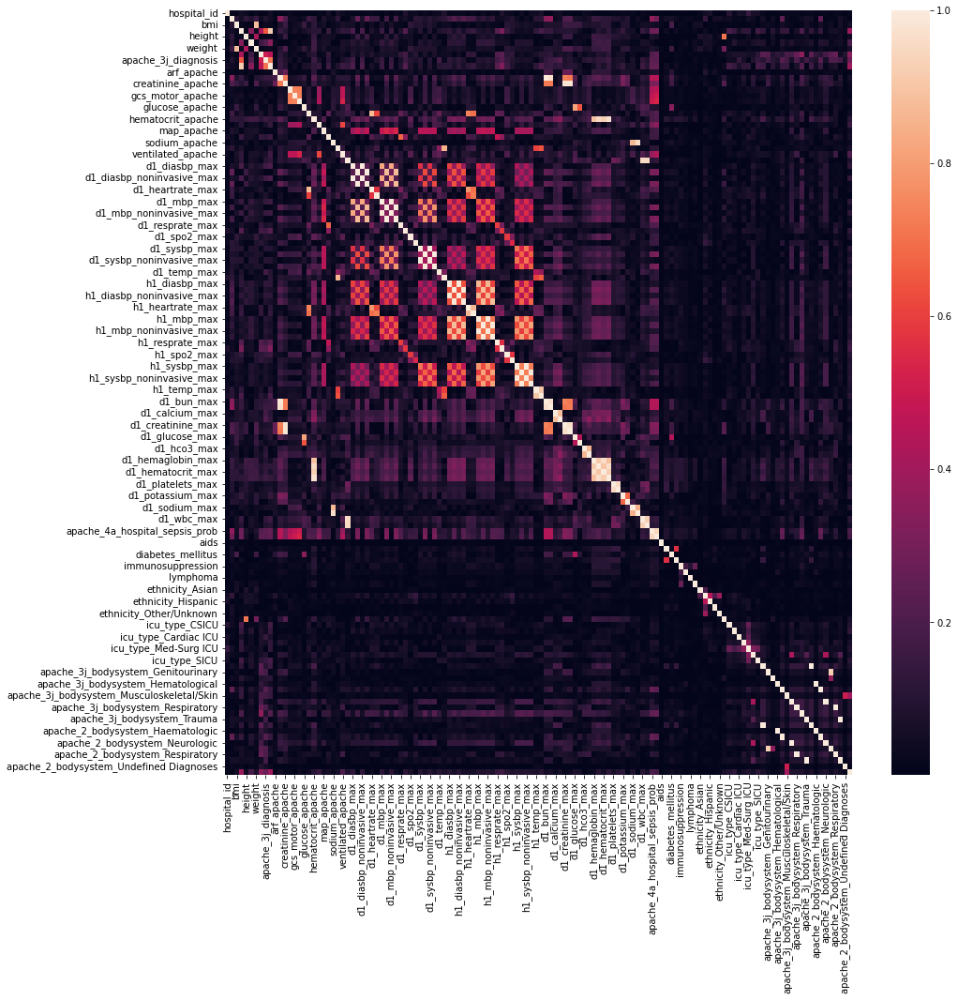

In [43]:
plt.figure(figsize=(15,15))
sns.heatmap(corr_mat)

In [44]:
#Getting the upper triangle from the correlation matrix
upper=corr_mat.where(np.triu(np.ones(corr_mat.shape),k=1).astype(np.bool))

In [45]:
upper

,hospital_id,age,bmi,elective_surgery,height,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,apache_4a_hospital_sepsis_prob,apache_4a_icu_sepsis_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,gender_M,icu_type_CSICU,icu_type_CTICU,icu_type_Cardiac ICU,icu_type_MICU,icu_type_Med-Surg ICU,icu_type_Neuro ICU,icu_type_SICU,apache_3j_bodysystem_Gastrointestinal,apache_3j_bodysystem_Genitourinary,apache_3j_bodysystem_Gynecological,apache_3j_bodysystem_Hematological,apache_3j_bodysystem_Metabolic,apache_3j_bodysystem_Musculoskeletal/Skin,apache_3j_bodysystem_Neurological,apache_3j_bodysystem_Respiratory,apache_3j_bodysystem_Sepsis,apache_3j_bodysystem_Trauma,apache_2_bodysystem_Gastrointestinal,apache_2_bodysystem_Haematologic,apache_2_bodysystem_Metabolic,apache_2_bodysystem_Neurologic,apache_2_bodysystem_Renal/Genitourinary,apache_2_bodysystem_Respiratory,apache_2_bodysystem_Trauma,apache_2_bodysystem_Undefined Diagnoses,apache_2_bodysystem_Undefined diagnoses
hospital_id,NaN,0.023046,0.014703,0.049647,0.033495,0.000866,0.027434,0.005550,0.017585,0.047964,0.000385,0.008449,0.013198,0.026168,0.013921,0.009046,0.007863,0.001770,0.000898,0.016270,0.012759,0.054585,0.003439,0.059842,0.034473,0.019394,0.012832,0.015559,0.012855,0.015755,0.019620,0.014032,0.005818,0.030437,0.006060,0.030315,0.014507,0.083630,0.025829,0.033792,0.009972,0.029607,0.009554,0.029469,0.034897,0.080696,0.019332,0.025912,0.019883,0.022735,0.004763,0.022250,0.011027,0.032056,0.009597,0.030069,0.018210,0.079155,0.034078,0.026530,0.001634,0.038579,0.001074,0.038528,0.045206,0.068144,0.008044,0.009023,0.039987,0.046007,0.015116,0.013134,0.003566,0.003138,0.032027,0.030671,0.013144,0.007160,0.007119,0.002012,0.015735,0.014463,0.021034,0.011867,0.023314,0.002739,0.023601,0.018441,0.011255,0.001336,0.003196,0.007668,0.004331,0.002292,0.008219,0.009682,0.002801,0.007692,0.019434,0.048282,0.070106,0.008408,0.006511,0.010381,0.096917,0.019547,0.063454,0.054071,0.151043,0.066156,0.055449,0.022047,0.006083,0.002519,0.007910,0.012637,0.019986,0.018626,0.022033,0.011496,0.017696,0.022047,0.007910,0.012637,0.018626,0.006110,0.022033,0.017696,0.004668,0.020737
age,NaN,NaN,0.102192,0.054517,0.123064,0.090182,0.148448,0.035333,0.088868,0.045835,0.019419,0.341147,0.206540,0.042142,0.035899,0.021180,0.045058,0.161223,0.121132,0.008750,0.076555,0.031430,0.042749,0.113531,0.006724,0.011917,0.073898,0.251466,0.073416,0.251180,0.154576,0.151041,0.014250,0.172263,0.014217,0.172481,0.031633,0.051329,0.029938,0.113899,0.104631,0.075637,0.104315,0.075678,0

In [46]:
#Using threshold value as 0.9. Getting the list of columns which has
high_corr = [col for col in upper.columns if any(upper[col] > 0.9)]
high_corr

['apache_post_operative',
 'd1_diasbp_noninvasive_max',
 'd1_diasbp_noninvasive_min',
 'd1_mbp_noninvasive_max',
 'd1_mbp_noninvasive_min',
 'd1_sysbp_noninvasive_max',
 'd1_sysbp_noninvasive_min',
 'h1_diasbp_noninvasive_max',
 'h1_diasbp_noninvasive_min',
 'h1_mbp_noninvasive_max',
 'h1_mbp_noninvasive_min',
 'h1_sysbp_noninvasive_max',
 'h1_sysbp_noninvasive_min',
 'd1_bun_max',
 'd1_bun_min',
 'd1_creatinine_max',
 'd1_creatinine_min',
 'd1_hemaglobin_min',
 'd1_hematocrit_max',
 'd1_hematocrit_min',
 'd1_platelets_min',
 'd1_sodium_min',
 'd1_wbc_max',
 'd1_wbc_min',
 'apache_4a_icu_sepsis_prob',
 'apache_2_bodysystem_Gastrointestinal',
 'apache_2_bodysystem_Haematologic',
 'apache_2_bodysystem_Metabolic',
 'apache_2_bodysystem_Neurologic',
 'apache_2_bodysystem_Renal/Genitourinary',
 'apache_2_bodysystem_Respiratory',
 'apache_2_bodysystem_Trauma']

In [47]:
len(high_corr)

32

In [48]:
x1 = x.drop(high_corr,axis=1)

In [49]:
#We now have 98 columns
x1.shape

(27795, 98)

In [50]:
x1.head()

,hospital_id,age,bmi,elective_surgery,height,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_max,h1_temp_min,d1_calcium_max,d1_calcium_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_platelets_max,d1_potassium_max,d1_potassium_min,d1_sodium_max,apache_4a_hospital_sepsis_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,gender_M,icu_type_CSICU,icu_type_CTICU,icu_type_Cardiac ICU,icu_type_MICU,icu_type_Med-Surg ICU,icu_type_Neuro ICU,icu_type_SICU,apache_3j_bodysystem_Gastrointestinal,apache_3j_bodysystem_Genitourinary,apache_3j_bodysystem_Gynecological,apache_3j_bodysystem_Hematological,apache_3j_bodysystem_Metabolic,apache_3j_bodysystem_Musculoskeletal/Skin,apache_3j_bodysystem_Neurological,apache_3j_bodysystem_Respiratory,apache_3j_bodysystem_Sepsis,apache_3j_bodysystem_Trauma,apache_2_bodysystem_Undefined Diagnoses,apache_2_bodysystem_Undefined diagnoses
0,118,68.0,22.730000,0,180.3,0.541667,73.9,113.0,502.01,0.0,31.0,2.51,3.0,6.0,4.0,168.0,118.0,27.4,0.0,40.0,36.0,134.0,39.3,0.0,14.1,68.0,37.0,119.0,72.0,89.0,46.0,34.0,10.0,100.0,74.0,131.0,73.0,39.9,37.2,68.0,63.0,119.0,108.0,86.0,85.0,26.0,18.0,100.0,74.0,131.0,115.0,39.5,37.5,8.5,7.4,168.0,109.0,19.0,15.0,8.9,233.0,4.0,3.4,136.0,0.10,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,81,77.0,27.420000,0,160.0,0.927778,70.2,108.0,203.01,0.0,9.0,0.56,1.0,3.0,1.0,145.0,120.0,36.9,0.0,46.0,33.0,145.0,35.1,1.0,12.7,95.0,31.0,118.0,72.0,120.0,38.0,32.0,12.0,100.0,70.0,159.0,67.0,36.3,35.1,61.0,48.0,114.0,100.0,85.0,57.0,31.0,28.0,95.0,70.0,95.0,71.0,36.3,36.3,8.6,8.0,145.0,128.0,27.0,26.0,11.3,557.0,4.2,3.8,145.0,0.47,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0
5,83,67.0,27.560000,0,190.5,0.000694,100.0,301.0,403.01,0.0,13.0,0.71,4.0,6.0,5.0,156.0,113.0,44.2,0.0,130.0,35.0,137.0,36.6,0.0,10.9,100.0,61.0,113.0,83.0,127.0,80.0,32.0,10.0,97.0,91.0,173.0,107.0,36.8,36.6,89.0,89.0,83.0,83.0,111.0,111.0,12.0,12.0,97.0,97.0,143.0,143.0,36.7,36.7,8.8,8.8,156.0,125.0,27.0,27.0,15.6,159.0,3.9,3.7,137.0,0.05,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
17,118,46.0,25.845717,0,167.6,0.000000,72.6,108.0,203.01,0.0,15.0,1.00,1.0,4.0,1.0,143.0,114.0,44.2,1.0,113.0,34.0,132.0,36.4,1.0,9.7,89.0,61.0,98.0,64.0,113.0,76.0,22.0,9.0,100.0,88.0,169.0,102.0,37.1,36.4,89.0,63.0,94.0,80.0,104.0,88.0,21.0,9.0,99.0,95.0,169.0,115.0,36.6,36.6,8.5,8.5,143.0,143.0,27.0,27.0,15.0,247.0,4.9,4.9,132.0,0.11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
23,118,87.0,21.963763,0,180.3,5.046528,71.4,113.0,501.05,0.0,13.0,0.94,3.0,6.0,1.0,105.0,99.0,28.9,0.0,133.0,33.0,146.0,36.3,1.0,9.9,88.0,65.0,116.0,74.0,123.0,90.0,36.0,16.0,100.0,90.0,179.0,129.0,36.8,35.6,71.0,65.0,116.0,92.0,102.0,90.0,36.0,28.0,99.0,90.0,159.0,129.0,36.8,36.3,7.7,7.7,144.0,87.0,26.0,26.0,9.7,273.0,3.4,3.3,146.0,0.31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [51]:
#Selecting the best features for EDA purpose

In [52]:
bestfeatures = SelectKBest(score_func=mutual_info_classif,k=20)
bestfeatures.fit(x1,y)
cols_idx = bestfeatures.get_support(indices=True)
best_features = x1.iloc[:,cols_idx]

In [53]:
best_features = pd.concat([best_features, pd.DataFrame(y)],axis=1)

In [54]:
best_features

,apache_2_diagnosis,apache_3j_diagnosis,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_verbal_apache,intubated_apache,map_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_min,d1_mbp_min,d1_spo2_min,d1_sysbp_min,d1_temp_min,d1_hco3_max,d1_hco3_min,apache_4a_hospital_sepsis_prob,septic_shock
0,113.0,502.01,31.0,2.51,3.0,6.0,4.0,0.0,40.0,39.3,0.0,14.10,37.0,46.0,74.0,73.0,37.2,19.0,15.0,0.10,0
1,108.0,203.01,9.0,0.56,1.0,3.0,1.0,0.0,46.0,35.1,1.0,12.70,31.0,38.0,70.0,67.0,35.1,27.0,26.0,0.47,0
5,301.0,403.01,13.0,0.71,4.0,6.0,5.0,0.0,130.0,36.6,0.0,10.90,61.0,80.0,91.0,107.0,36.6,27.0,27.0,0.05,0
17,108.0,203.01,15.0,1.00,1.0,4.0,1.0,1.0,113.0,36.4,1.0,9.70,61.0,76.0,88.0,102.0,36.4,27.0,27.0,0.11,0
23,113.0,501.05,13.0,0.94,3.0,6.0,1.0,0.0,133.0,36.3,1.0,9.90,65.0,90.0,90.0,129.0,35.6,26.0,26.0,0.31,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91675,106.0,212.01,6.0,0.60,4.0,6.0,5.0,0.0,62.0,36.9,0.0,8.88,46.0,61.0,64.0,99.0,36.8,22.0,22.0,0.02,0
91677,219.0,1504.03,4.0,0.60,3.0,6.0,5.0,0.0,63.0,36.5,0.0,13.44,38.0,46.0,91.0,65.0,36.5,26.0,26.0,0.01,0
91698,304.0,1406.01,9.0,0.50,4.0,6.0,2.0,0.0,66.0,36.5,0.0,13.91,57.0,66.0,93.0,87.0,36.5,24.0,24.0,0.01,0
91706,109.0,108.01,15.0,0.70,4.0,6.0,5.0,0.0,62.0,36.6,0.0,7.14,54.0,62.0,90.0,90.0,36.6,30.0,26.0,0.01,0


In [55]:
#We will work with the above data to get some insights.

In [56]:
dic[dic['Variable Name'].isin(list(best_features.columns))]

,Category,Variable Name,Unit of Measure,Data Type,Description,Example
20,APACHE covariate,apache_2_diagnosis,None,string,The APACHE II diagnosis for the ICU admission,308
21,APACHE covariate,apache_3j_diagnosis,None,string,The APACHE III-J sub-diagnosis code which best describes the reason for the ICU admission,1405
25,APACHE covariate,bun_apache,mmol/L,numeric,The blood urea nitrogen concentration measured during the first 24 hours which results in the highest APACHE III score,None
26,APACHE covariate,creatinine_apache,micromol/L,numeric,The creatinine concentration measured during the first 24 hours which results in the highest APACHE III score,70
28,APACHE covariate,gcs_eyes_apache,None,integer,The eye opening component of the Glasgow Coma Scale measured during the first 24 hours which results in the highest APACHE III score,4
29,APACHE covariate,gcs_motor_apache,None,integer,The motor component of the Glasgow Coma Scale measured during the first 24 hours which results in the highest APACHE III score,6
31,APACHE covariate,gcs_verbal_apache,None,integer,The verbal component of the Glasgow Coma Scale measured during the first 24 hours which results in the highest APACHE III score,5
35,APACHE covariate,intubated_apache,None,binary,Whether the patient was intubated at the time of the highest scoring arterial blood gas used in the oxygenation score,0
36,APACHE covariate,map_apache,Millimetres of mercury,numeric,The mean arterial pressure measured during the first 24 hours which results in the highest APACHE III score,None
43,APACHE covariate,temp_apache,Degrees Celsius,numeric,The temperature measured during the first 24 hours which results in the highest APACHE III score,33


In [57]:
best_features.info()
#All 20 are numeric columns

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27795 entries, 0 to 91709
Data columns (total 21 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   apache_2_diagnosis              27795 non-null  float64
 1   apache_3j_diagnosis             27795 non-null  float64
 2   bun_apache                      27795 non-null  float64
 3   creatinine_apache               27795 non-null  float64
 4   gcs_eyes_apache                 27795 non-null  float64
 5   gcs_motor_apache                27795 non-null  float64
 6   gcs_verbal_apache               27795 non-null  float64
 7   intubated_apache                27795 non-null  float64
 8   map_apache                      27795 non-null  float64
 9   temp_apache                     27795 non-null  float64
 10  ventilated_apache               27795 non-null  float64
 11  wbc_apache                      27795 non-null  float64
 12  d1_diasbp_min                   

In [58]:
best_features.describe()

,apache_2_diagnosis,apache_3j_diagnosis,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_verbal_apache,intubated_apache,map_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_min,d1_mbp_min,d1_spo2_min,d1_sysbp_min,d1_temp_min,d1_hco3_max,d1_hco3_min,apache_4a_hospital_sepsis_prob,septic_shock
count,27795.000000,27795.000000,27795.000000,27795.000000,27795.000000,27795.000000,27795.000000,27795.000000,27795.000000,27795.00000,27795.000000,27795.000000,27795.000000,27795.000000,27795.000000,27795.000000,27795.000000,27795.000000,27795.000000,27795.000000,27795.000000
mean,183.913366,583.737968,25.499734,1.473747,3.414535,5.421946,3.917899,0.173089,87.290592,36.37593,0.357402,12.101220,48.088109,62.107142,89.921677,93.783882,36.215312,24.306498,23.039223,0.111435,0.091239
std,85.048609,469.570485,20.653494,1.554645,0.987723,1.341724,1.596826,0.378331,43.369746,0.88566,0.479243,6.914437,12.401096,14.253105,9.776484,19.070151,0.763175,4.309496,4.924406,0.221134,0.287954
min,101.000000,101.010000,4.000000,0.300000,1.000000,1.000000,1.000000,0.000000,40.000000,32.10000,0.000000,0.900000,13.000000,22.000000,0.000000,41.000000,31.889000,12.000000,7.000000,-1.000000,0.000000
25%,113.000000,206.010000,13.000000,0.710000,3.000000,6.000000,3.000000,0.000000,52.000000,36.10000,0.000000,7.410000,40.000000,53.000000,89.000000,81.000000,36.100000,22.000000,20.000000,0.020000,0.000000
50%,122.000000,501.010000,19.000000,0.950000,4.000000,6.000000,5.000000,0.000000,65.000000,36.40000,0.000000,10.380000,48.000000,62.000000,92.000000,93.000000,36.400000,24.000000,23.000000,0.060000,0.000000
75%,301.000000,704.060000,31.000000,1.500000,4.000000,6.000000,5.000000,0.000000,125.000000,36.70000,1.000000,15.100000,56.000000,71.000000,95.000000,106.000000,36.600000,27.000000,26.000000,0.150000,0.000000
max,308.000000,2201.050000,127.000000,11.180000,4.000000,6.000000,5.000000,1.000000,200.000000,39.70000,1.000000,45.800000,90.000000,112.000000,100.000000,160.000000,37.800000,40.000000,39.000000,0.980000,1.000000


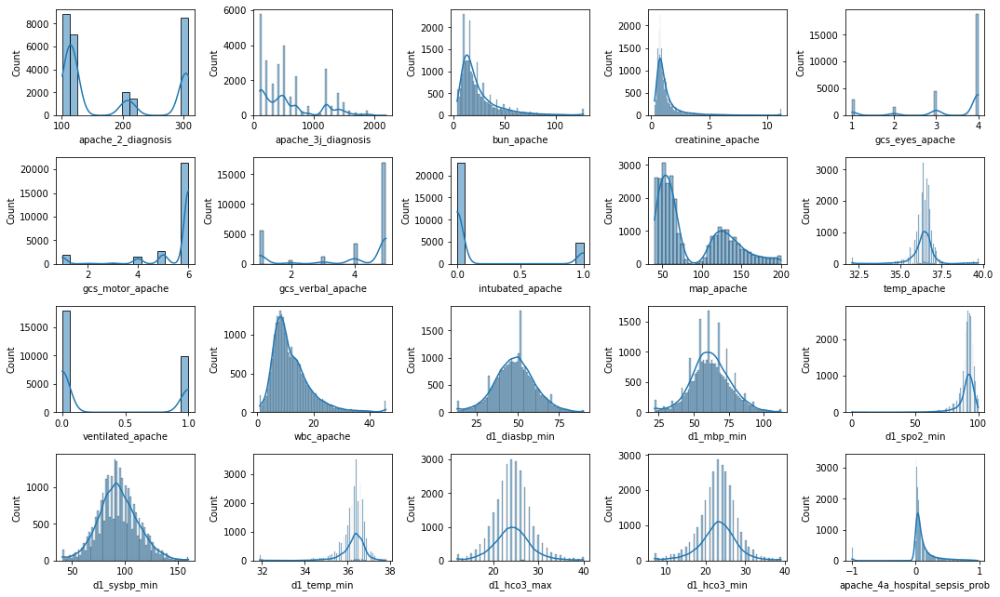

In [59]:
#plt.figure(figsize=(2000,15))
fig, axes = plt.subplots(4,5, figsize=(15,9))
c=0
for i in range(4):
    for j in range(5):
        sns.histplot(data = best_features, x = best_features.columns[c+i+j],kde=True,ax=axes[i,j])
    c=c+j
plt.tight_layout(pad =1)

In [60]:
# 'Apache_4_a_Hospital_sepsis_prob'. Many of them have 0 - 0.5 probability of having sepsis.
# Thus proving us the imbalance of the data.

In [61]:
#Note: apache_3j_diagnosis has different range of values when compared to other variables.

In [62]:
# We can see the distribution of each variable above. And we can find some variables like 
#'d1_diasbp_min' , 'd1_sysbp_min' and some other features are normally distributed. 

In [63]:
best_features_uni = best_features.apply(pd.Series.nunique)[:-1]
best_features_uni

apache_2_diagnosis                  44
apache_3j_diagnosis                363
bun_apache                         195
creatinine_apache                  938
gcs_eyes_apache                      4
gcs_motor_apache                     6
gcs_verbal_apache                    5
intubated_apache                     2
map_apache                         153
temp_apache                        146
ventilated_apache                    2
wbc_apache                        2515
d1_diasbp_min                       78
d1_mbp_min                          91
d1_spo2_min                        101
d1_sysbp_min                       120
d1_temp_min                        143
d1_hco3_max                        142
d1_hco3_min                        136
apache_4a_hospital_sepsis_prob     100
dtype: int64

In [64]:
#Getting the discrete variables. Setting a threshold value as 10 commonly.
best_features_cat = best_features_uni[best_features_uni<=10]

In [65]:
best_features_cat

gcs_eyes_apache      4
gcs_motor_apache     6
gcs_verbal_apache    5
intubated_apache     2
ventilated_apache    2
dtype: int64

In [66]:
best_features_cont =best_features_uni[best_features_uni>10]
best_features_cont

apache_2_diagnosis                  44
apache_3j_diagnosis                363
bun_apache                         195
creatinine_apache                  938
map_apache                         153
temp_apache                        146
wbc_apache                        2515
d1_diasbp_min                       78
d1_mbp_min                          91
d1_spo2_min                        101
d1_sysbp_min                       120
d1_temp_min                        143
d1_hco3_max                        142
d1_hco3_min                        136
apache_4a_hospital_sepsis_prob     100
dtype: int64

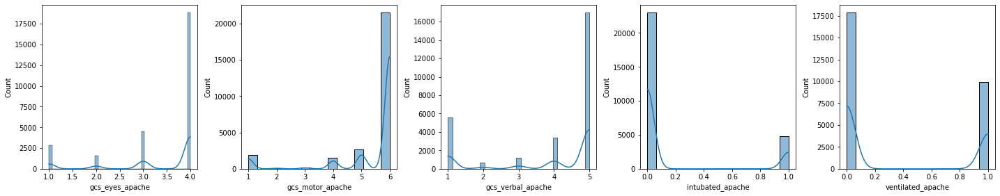

In [67]:
fig, axes = plt.subplots(1,5, figsize=(20,4))
for i in range(1):
    for j in range(5):
        sns.histplot(data = best_features, x = best_features_cat.index[i+j],kde=True,ax=axes[j])
plt.tight_layout(pad =1)

In [67]:
#We can see the unique values of the discrete variables and their distribution more clearly in the above plot.
#In gcs (eyes, motor, verbal) apache variables, Many of the patients seems to be in a greater number category(4,6,5).
#In intubated and ventilated apache, majority of them is 0(NO) category.

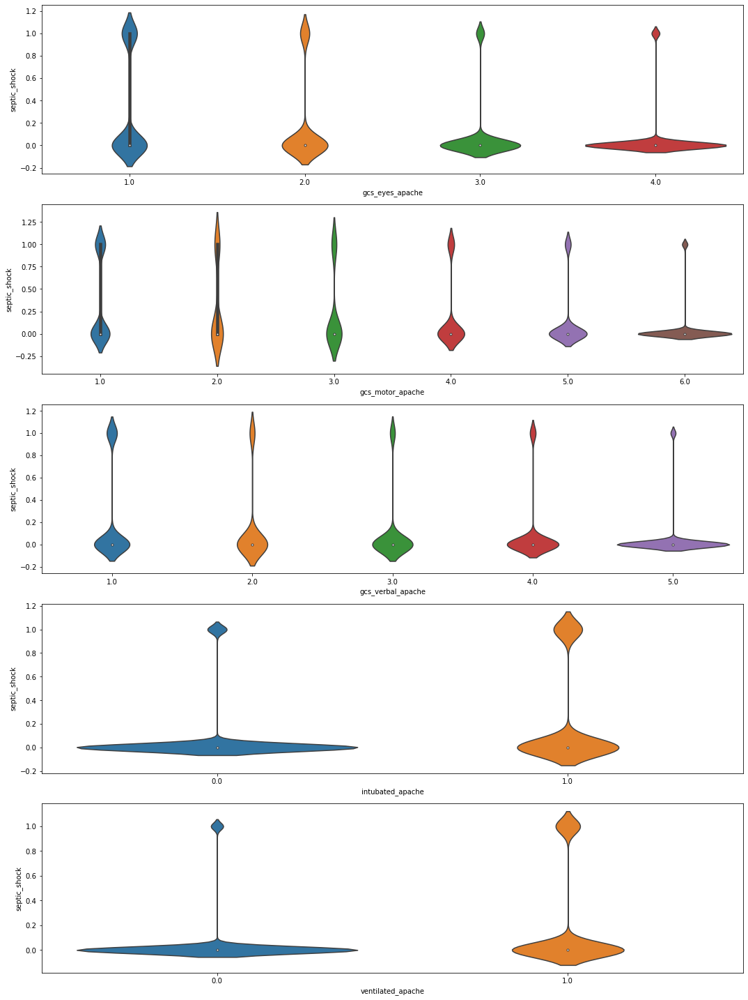

In [140]:
fig, axes = plt.subplots(5,1, figsize=(15,20))
for i in range(5):
    for j in range(1):
        sns.violinplot(data = best_features, x = best_features_cat.index[i+j],y='septic_shock',ax=axes[i])
plt.tight_layout(pad =1)

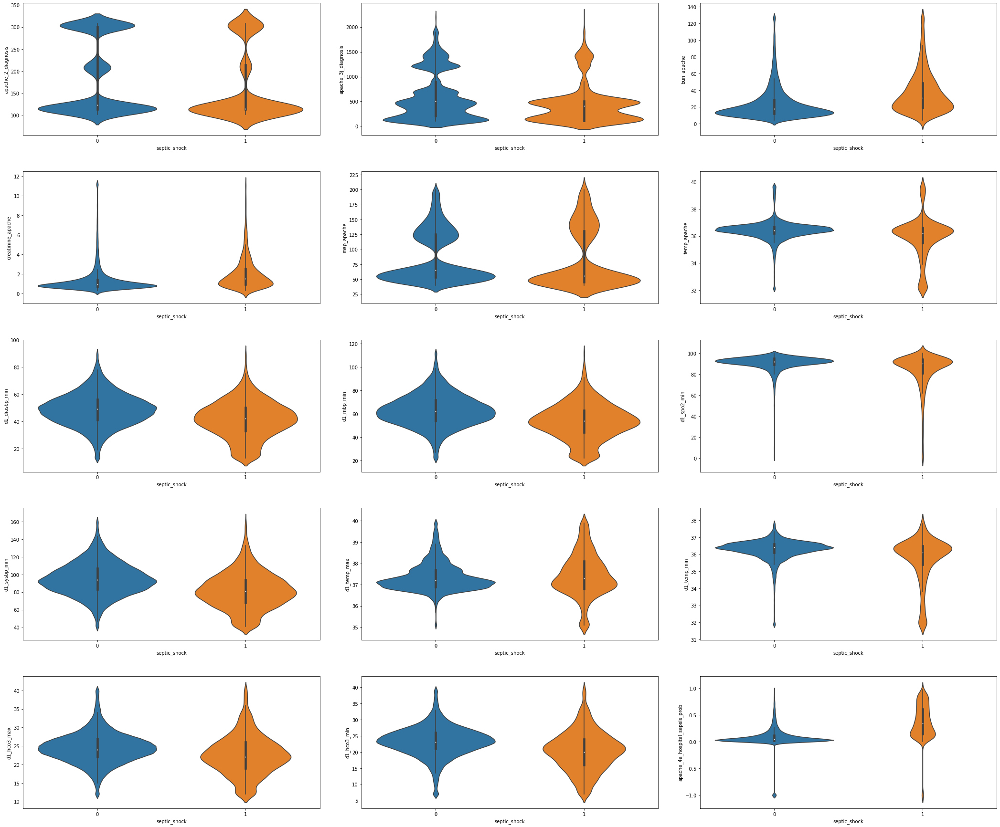

In [131]:
fig, axes = plt.subplots(5,3, figsize=(30,25))
c=0
for i in range(5):
    for j in range(3):
        sns.violinplot(data = best_features, y = best_features_cont.index[c+i+j],x='septic_shock',ax=axes[i,j])
    c=c+j
plt.tight_layout(pad =4)

<AxesSubplot:xlabel='septic_shock', ylabel='d1_temp_max'>

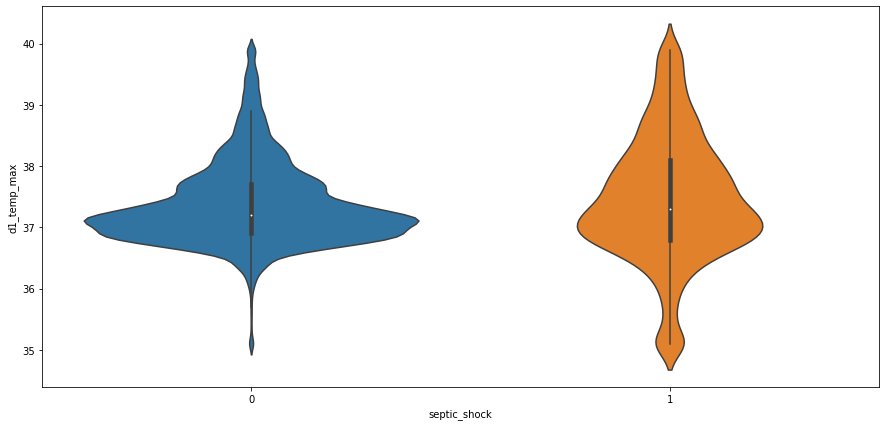

In [136]:
plt.figure(figsize=(15,7))
sns.violinplot(data = best_features, y = 'd1_temp_max',x='septic_shock')
#d1_temp_max in th range(32-36) having a higher chance to be in category 1(Sepsis) when compared to 0.
#In the range(37-39), it ha a higher chance to be in category 0. Greater than 39, tends to be in category 1.

<AxesSubplot:xlabel='septic_shock', ylabel='apache_3j_diagnosis'>

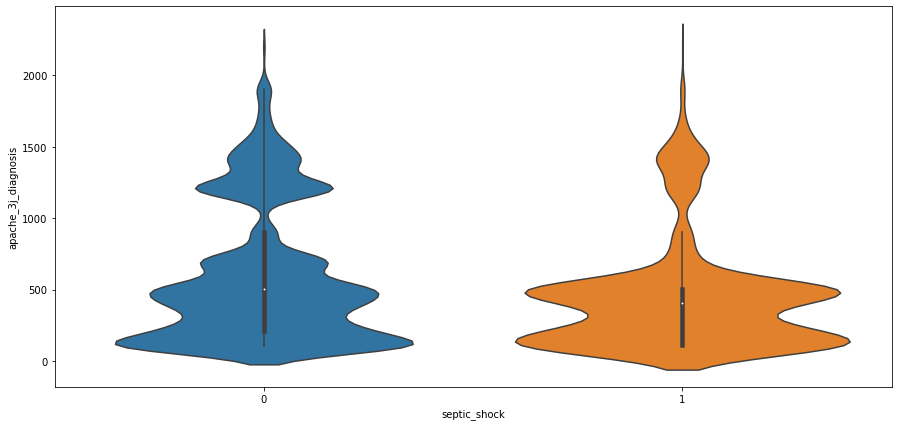

In [139]:
plt.figure(figsize=(15,7))
sns.violinplot(data = best_features, y = 'apache_3j_diagnosis',x='septic_shock')

In [68]:
#From the above plots, we can get a sense of what range of measurements like 
#d1_temp_max, apache_3j_diagnosis tend to have higher chance of having sepsis.


In [69]:
#Insights: In majority of the features, extreme values tend to have higher chance of having sepsis. 
#Also, the different class data points are not very much separated. (Imbalance data)
#Note that, we are just focusing on one feature at a time here. 

<AxesSubplot:xlabel='apache_4a_hospital_sepsis_prob', ylabel='apache_3j_diagnosis'>

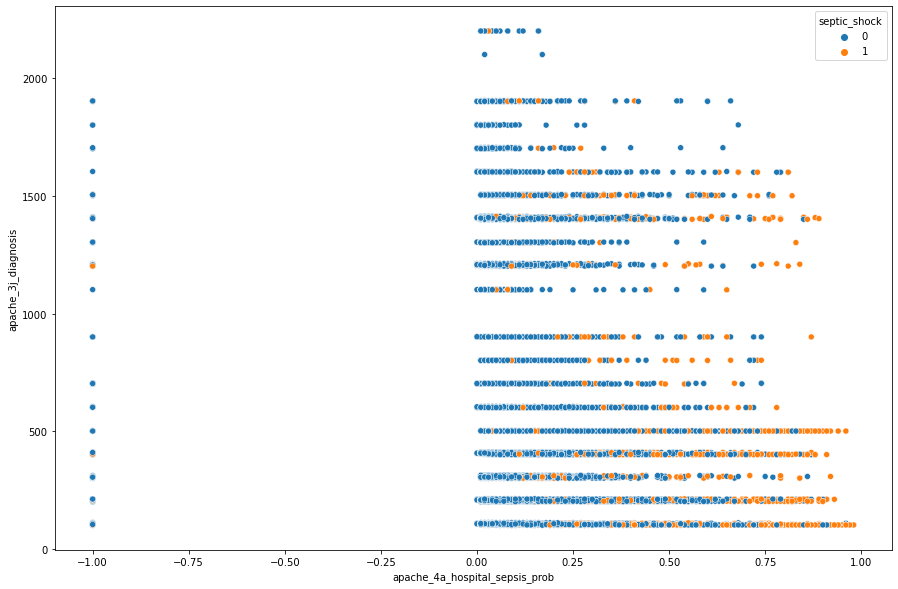

In [150]:
plt.figure(figsize=(15,10))
sns.scatterplot(data=best_features,x='apache_4a_hospital_sepsis_prob',y='apache_3j_diagnosis',hue='septic_shock')
#Higher the probability value, it tensds to be sepsis.

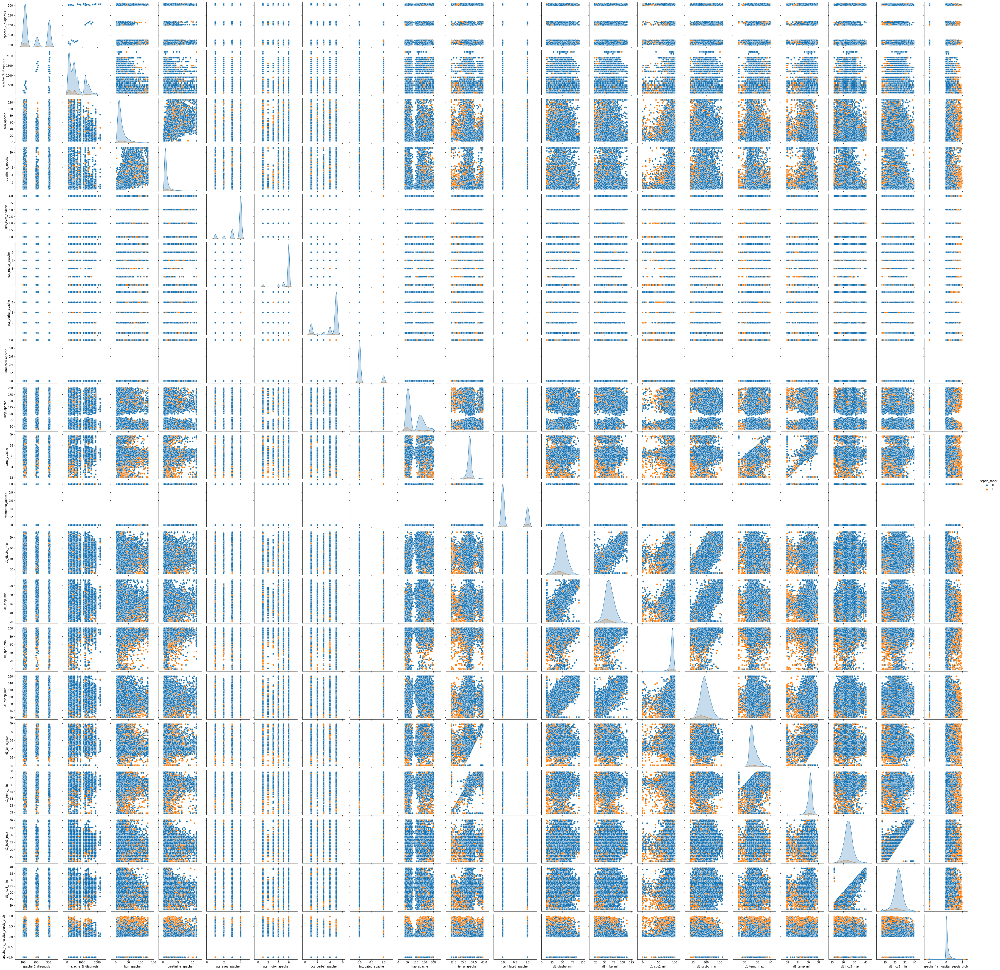

In [86]:
sns.pairplot(best_features,hue='septic_shock')

In [70]:
#From the pairplot above, we can see we cannot separate the the categories by any linear decision boundary.
#Too much overlapping between data points

In [71]:
#Still we didn't get any clear pattern in the data. We can us PCA and visualize the patern in the data.

In [72]:
#Loading the PCA Algorithm
pca_3 = PCA(n_components=3)
pca_3

PCA(n_components=3)

In [73]:
# Let's fit the data. We do not need to scale it, since sklearn's implementation already handles it.
pca_3.fit(x1)

PCA(n_components=3)

In [74]:
pca_3.explained_variance_ratio_

array([0.82751103, 0.05636715, 0.03013105])

In [75]:
# The coordinates on the first principal component (first axis) are enough to retain 
# 82.75% of the information ("explained variance").  The second principal component adds an additional 5.63% 
# of the information ("explained variance") that is not stored in the first principal component coordinates.
#The third pincipal component adds an additional 3% of the information tat is not stored in the first 2 pcs'.
#So, we captured around 90%of the variation (information) of the original dataset.

In [76]:
X_trans_pca_3 = pca_3.transform(x1)
X_trans_pca_3 = pd.DataFrame(X_trans_pca_3)

In [77]:
X_trans_pca_3.head()

,0,1,2
0,-86.964952,8.867769,13.701257
1,-387.620180,10.518161,334.037425
2,-171.603161,-21.951884,-26.912685
3,-385.879160,-20.855563,39.997705
4,-88.765818,-50.728501,69.728869


In [78]:
X_trans_pca_3[0]

0        -86.964952
1       -387.620180
2       -171.603161
3       -385.879160
4        -88.765818
            ...    
27790   -376.891285
27791    919.767580
27792    829.442947
27793   -480.612802
27794    -87.003371
Name: 0, Length: 27795, dtype: float64

In [79]:
#Now lets use this in a 3d plot for visualization.

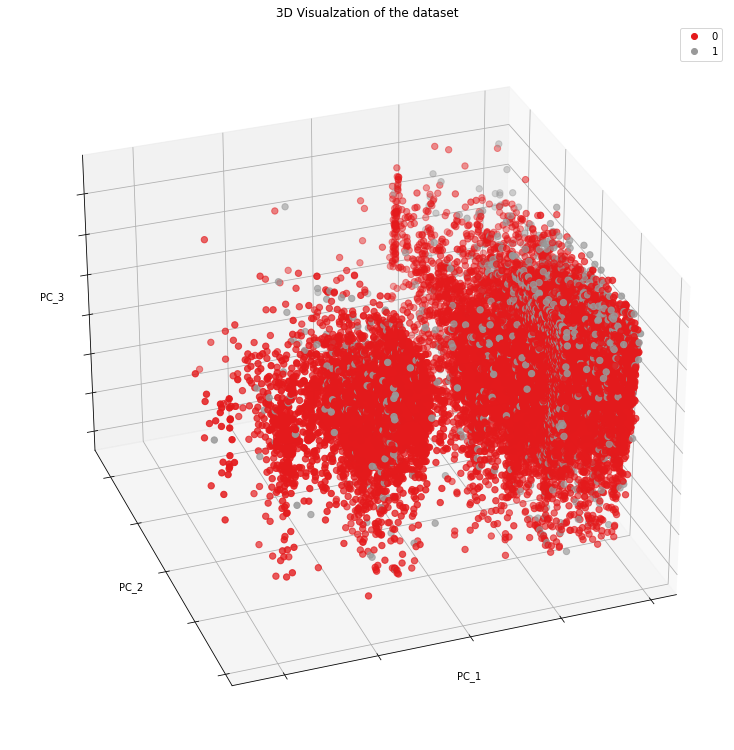

In [99]:
fig = plt.figure(1,figsize=(12,10))
ax =Axes3D(fig,elev = -150, azim = 110)
ax.set_title('3D Visualzation of the dataset')
ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.set_xlabel('PC_1')
ax.set_ylabel('PC_2')
ax.set_zlabel('PC_3')
ax.w_zaxis.set_ticklabels([])
p1 = ax.scatter(X_trans_pca_3[0], X_trans_pca_3[1], X_trans_pca_3[2], c = y, cmap = plt.cm.Set1, s=40)
plt.legend(handles = p1.legend_elements()[0], labels = ['0','1'])

In [80]:
#Overlapping of datapoints and they seem to be similar to each other (category 0 datapoints and category 1 datapoints).
#No clear Distinction.

In [81]:
#Standardising the data for the building the model
scale=StandardScaler()
x_scaled=scale.fit_transform(x1)
x_scaled=pd.DataFrame(x_scaled,columns=x1.columns)
x_scaled.head()

,hospital_id,age,bmi,elective_surgery,height,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_max,h1_temp_min,d1_calcium_max,d1_calcium_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_platelets_max,d1_potassium_max,d1_potassium_min,d1_sodium_max,apache_4a_hospital_sepsis_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,gender_M,icu_type_CSICU,icu_type_CTICU,icu_type_Cardiac ICU,icu_type_MICU,icu_type_Med-Surg ICU,icu_type_Neuro ICU,icu_type_SICU,apache_3j_bodysystem_Gastrointestinal,apache_3j_bodysystem_Genitourinary,apache_3j_bodysystem_Gynecological,apache_3j_bodysystem_Hematological,apache_3j_bodysystem_Metabolic,apache_3j_bodysystem_Musculoskeletal/Skin,apache_3j_bodysystem_Neurological,apache_3j_bodysystem_Respiratory,apache_3j_bodysystem_Sepsis,apache_3j_bodysystem_Trauma,apache_2_bodysystem_Undefined Diagnoses,apache_2_bodysystem_Undefined diagnoses
0,0.177379,0.323313,-0.790452,-0.485281,0.964550,-0.099764,-0.423560,-0.833813,-0.174051,-0.172038,0.266316,0.666565,-0.419695,0.430837,0.051416,0.112902,0.544401,-0.854216,-0.457515,-1.090425,0.768546,-0.784882,3.301630,-0.745777,0.289079,-1.181023,-0.894139,0.617989,0.129212,-0.818636,-1.130100,0.438756,-0.496830,0.416221,-1.628598,-0.778356,-1.089884,3.571036,1.290275,-0.455165,0.080216,1.146193,1.179437,-0.257996,0.399498,0.448438,0.220678,0.667466,-3.276021,-0.098954,0.027213,3.568600,1.114280,0.191233,-0.954926,-0.076659,-0.125650,-1.231372,-1.632556,-1.211333,0.277648,-0.401227,-0.924113,-0.687554,-0.051712,-0.027497,-0.142476,1.824306,-0.129293,-0.184396,-0.087461,-0.065573,-0.155837,-0.101422,0.502753,-0.228916,-0.103927,-0.194782,0.906327,-0.251135,5.630275,-0.225325,-0.336423,-1.045691,-0.314171,-0.268264,-0.351532,-0.158838,-0.061284,-0.086621,-0.298215,-0.114551,-0.391010,-0.389786,2.452630,-0.224972,-0.057941,-0.205573
1,-0.410462,0.868802,-0.219481,-0.485281,-0.932483,0.067446,-0.571766,-0.892604,-0.810815,-0.172038,-0.798898,-0.587764,-2.444591,-1.805133,-1.827344,-0.146187,0.609141,0.540746,-0.457515,-0.952077,0.564409,1.350185,-1.440680,1.340883,0.086600,0.209474,-1.377976,0.572179,0.129212,0.693448,-1.691391,0.247034,-0.052691,0.416221,-2.037750,0.338913,-1.404518,-1.522299,-1.461436,-0.834140,-0.858565,0.919088,0.785955,-0.306871,-1.119850,1.134182,2.011291,-1.211772,-3.900115,-1.403809,-1.656770,-0.552980,-0.393071,0.326793,-0.191412,-0.345235,0.387360,0.625027,0.601256,-0.102145,3.884500,-0.100228,-0.234034,1.206102,1.621509,-0.027497,-0.142476,1.824306,-0.129293,-0.184396,-0.087461,-0.065573,-0.155837,-0.101422,0.502753,-0.228916,-0.103927,-0.194782,-1.103355,-0.251135,-0.177611,-0.225325,-0.336423,0.956305,-0.314171,-0.268264,-0.351532,-0.158838,-0.061284,-0.086621,-0.298215,-0.114551,-0.391010,2.565508,-0.407726,-0.224972,-0.057941,-0.205573
2,-0.378686,0.262704,-0.202437,-0.485281,1.917739,-0.334039,0.621895,1.376727,-0.384886,-0.172038,-0.605222,-0.491277,0.592753,0.430837,0.677670,-0.022275,0.382552,1.612664,-0.457515,0.984792,0.700500,-0.202591,0.253002,-0.745777,-0.173730,0.466973,1.041208,0.343130,0.792118,1.034887,1.255388,0.247034,-0.496830,-1.866208,0.110300,0.897548,0.693039,-0.814892,0.504072,0.681759,1.707436,-0.488961,-0.050192,0

In [82]:
x_scaled.shape

(27795, 98)

In [83]:
# TRAIN TEST 
X_train,X_test,Y_train,Y_test=train_test_split(x_scaled,y,test_size=0.2,random_state=100,stratify=y)

In [84]:
#Basic RandomForest Model
base_rf_model = RandomForestClassifier(random_state=55)
base_rf_model_res = base_rf_model.fit(X_train,Y_train)

In [85]:
Y_predict=base_rf_model_res.predict(X_test)

In [86]:
confusion_matrix(Y_test,Y_predict)

array([[4995,   57],
       [ 381,  126]], dtype=int64)

In [87]:
print('TEST CLASSIFICATION REPORT:\n')
print(classification_report(Y_test,Y_predict))

TEST CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.93      0.99      0.96      5052
           1       0.69      0.25      0.37       507

    accuracy                           0.92      5559
   macro avg       0.81      0.62      0.66      5559
weighted avg       0.91      0.92      0.90      5559



In [88]:
parameters_to_tune = {'max_depth': [2, 4, 8, 16, 32, 64, None],
                      'min_samples_split': [10,30,50,300, 900, 1500, 3000],
                      'n_estimators': [50,100,250,500],
                      'class_weight':['balanced', {1:2},{1:3},{1:4},{1:5},{1:10},{1:20},{1:50}]}

In [101]:
gsc_rf = GridSearchCV(estimator= base_rf_model, param_grid= parameters_to_tune, cv = 3, n_jobs= -1, scoring= 'f1')

gsc_rf_res = gsc_rf.fit(X_train,Y_train)

print(f'Best Parameters using Grid Search: {gsc_rf_res.best_params_}')
print(f'Best Score: {gsc_rf_res.best_score_}')

Best Parameters using Grid Search: {'class_weight': {1: 5}, 'max_depth': 8, 'min_samples_split': 30, 'n_estimators': 50}
Best Score: 0.5075500091686357


In [88]:
#Took long time to find the above parameters
rf_model_1 = RandomForestClassifier(class_weight = {1: 5}, max_depth = 8, 
                                    min_samples_split = 30, n_estimators = 50,random_state=55)
rf_model_1_res = rf_model_1.fit(X_train,Y_train)

In [89]:
Y_predict_rf_1=rf_model_1_res.predict(X_test)

In [90]:
confusion_matrix(Y_test,Y_predict_rf_1)

array([[4709,  343],
       [ 226,  281]], dtype=int64)

In [1466]:
print('TEST CLASSIFICATION REPORT:\n')
print(classification_report(Y_test,Y_predict_rf_1))

TEST CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.95      0.93      0.94      5052
           1       0.45      0.55      0.50       507

    accuracy                           0.90      5559
   macro avg       0.70      0.74      0.72      5559
weighted avg       0.91      0.90      0.90      5559



In [434]:
Y_predict_rf_1_train = rf_model_1_res.predict(X_train)

In [1464]:
print('TRAINING CLASSIFICATION REPORT:\n')
print(classification_report(Y_train,Y_predict_rf_1_train))

TRAINING CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.97      0.94      0.96     20207
           1       0.55      0.67      0.61      2029

    accuracy                           0.92     22236
   macro avg       0.76      0.81      0.78     22236
weighted avg       0.93      0.92      0.92     22236



In [912]:
#Just altered a bit from the previous model to reduce the risk of overfitting
rf_model_2 = RandomForestClassifier(class_weight = {1: 5}, max_depth = 7, 
                                    min_samples_split = 30, n_estimators = 50,random_state=55)
rf_model_2_res = rf_model_2.fit(X_train,Y_train)

In [913]:
Y_predict_rf_2=rf_model_2_res.predict(X_test)

In [914]:
confusion_matrix(Y_test,Y_predict_rf_2)

array([[4707,  345],
       [ 229,  278]], dtype=int64)

In [1467]:
print('TEST CLASSIFICATION REPORT:\n')
print(classification_report(Y_test,Y_predict_rf_2))

TEST CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.95      0.93      0.94      5052
           1       0.45      0.55      0.49       507

    accuracy                           0.90      5559
   macro avg       0.70      0.74      0.72      5559
weighted avg       0.91      0.90      0.90      5559



In [916]:
Y_pred_train_rf_2 = rf_model_2_res.predict(X_train)

In [1463]:
print('TRAINING CLASSIFICATION REPORT:\n')
print(classification_report(Y_train,Y_pred_train_rf_2))

TRAINING CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.96      0.94      0.95     20207
           1       0.52      0.64      0.57      2029

    accuracy                           0.91     22236
   macro avg       0.74      0.79      0.76     22236
weighted avg       0.92      0.91      0.92     22236



In [96]:
#In the above model, the recall increases but the precision goes down. Also, f1 score is less than the previous one.

In [98]:
lr_base_model = LogisticRegression(random_state=55)
lr_base_res = lr_base_model.fit(X_train,Y_train)

In [99]:
Y_predict_lr_base = lr_base_res.predict(X_test)

In [100]:
confusion_matrix(Y_test,Y_predict_lr_base)

array([[4950,  102],
       [ 356,  151]], dtype=int64)

In [1468]:
print('TEST CLASSIFICATION REPORT:\n')
print(classification_report(Y_test,Y_predict_lr_base))

TEST CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.93      0.98      0.96      5052
           1       0.60      0.30      0.40       507

    accuracy                           0.92      5559
   macro avg       0.76      0.64      0.68      5559
weighted avg       0.90      0.92      0.90      5559



In [102]:
lr_weights = {'class_weight': ['balanced', {1:2},{1:3},{1:4},{1:5},{1:10},{1:20},{1:50}]}

In [128]:
#Getting the accurate weights
gsc_lr = GridSearchCV(estimator= lr_base_model, param_grid= lr_weights, cv = 5, n_jobs= -1, scoring= 'f1')
gsc_lr_res = gsc_lr.fit(X_train,Y_train)

print(f'Best Parameters using Grid Search: {gsc_lr_res.best_params_}')
print(f'Best Score: {gsc_lr_res.best_score_}')

Best Parameters using Grid Search: {'class_weight': {1: 3}}
Best Score: 0.4877206128937876


In [103]:
lr_model_1 = LogisticRegression(class_weight={1:3},random_state=55)
lr_model_1_res = lr_model_1.fit(X_train,Y_train)

In [104]:
Y_predict_lr_1 = lr_model_1_res.predict(X_test)

In [105]:
confusion_matrix(Y_test,Y_predict_lr_1)

array([[4739,  313],
       [ 247,  260]], dtype=int64)

In [1469]:
print('TEST CLASSIFICATION REPORT:\n')
print(classification_report(Y_test,Y_predict_lr_1))

TEST CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.95      0.94      0.94      5052
           1       0.45      0.51      0.48       507

    accuracy                           0.90      5559
   macro avg       0.70      0.73      0.71      5559
weighted avg       0.91      0.90      0.90      5559



In [437]:
Y_predict_lr_1_train = lr_model_1_res.predict(X_train)

In [524]:
confusion_matrix(Y_train,Y_predict_lr_1_train)

array([[19039,  1168],
       [  963,  1066]], dtype=int64)

In [1462]:
print('TRAINING CLASSIFICATION REPORT:\n')
print(classification_report(Y_train,Y_predict_lr_1_train))

TRAINING CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.95      0.94      0.95     20207
           1       0.48      0.53      0.50      2029

    accuracy                           0.90     22236
   macro avg       0.71      0.73      0.72     22236
weighted avg       0.91      0.90      0.91     22236



In [253]:
#Trying another set of weights in range(0,1)
weights = np.linspace(0.05, 0.95, 20)
lr_weights_1 = {'class_weight': [{0: x, 1: 1.0-x} for x in weights]}

In [159]:
gsc_lr_diffw = GridSearchCV(estimator= lr_base_model, param_grid= lr_weights_1, cv = 5, n_jobs= -1, scoring= 'f1')
gsc_lr_res_diffw = gsc_lr_diffw.fit(X_train,Y_train)

print(f'Best Parameters using Grid Search: {gsc_lr_res_diffw.best_params_}')
print(f'Best Score: {gsc_lr_res_diffw.best_score_}')

Best Parameters using Grid Search: {'class_weight': {0: 0.23947368421052628, 1: 0.7605263157894737}}
Best Score: 0.48843688330034174


In [108]:
lr_model_1_diff_w = LogisticRegression(class_weight={0: 0.23947368421052628, 1: 0.7605263157894737},random_state=55)
lr_model_1_diff_w_res = lr_model_1_diff_w.fit(X_train,Y_train)

In [109]:
Y_predict_lr_1_diffw = lr_model_1_diff_w_res.predict(X_test)

In [110]:
confusion_matrix(Y_test,Y_predict_lr_1_diffw)

array([[4711,  341],
       [ 243,  264]], dtype=int64)

In [1470]:
print('TEST CLASSIFICATION REPORT:\n')
print(classification_report(Y_test,Y_predict_lr_1_diffw))

TEST CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.95      0.93      0.94      5052
           1       0.44      0.52      0.47       507

    accuracy                           0.89      5559
   macro avg       0.69      0.73      0.71      5559
weighted avg       0.90      0.89      0.90      5559



In [112]:
#We are pretty much getting same results. Not much improvement. 
#Lets try to trade of betwen precision and recall with the help of precision recall curves

In [1431]:
lr_test_thres = LogisticRegression(class_weight={1:3},random_state=55)

In [1432]:
lr_test_thres.fit(X_train,Y_train)

LogisticRegression(class_weight={1: 3}, random_state=55)

In [1435]:
y_proba_lr_test_thres = lr_test_thres.predict_proba(X_train)
y_proba_list_thres = list(zip(Y_test[:20], y_proba_lr[0:20,1]))

# show the probability of positive class for first 20 instances
y_proba_list_thres

[(0, 0.11024774822617882),
 (1, 0.36569370387108163),
 (0, 0.03607653253490902),
 (0, 0.017867040850258222),
 (0, 0.8412277643207925),
 (0, 0.15543799717060564),
 (0, 0.04247422230986308),
 (0, 0.019495165535013976),
 (0, 0.02540879202878114),
 (0, 0.05967130478700615),
 (0, 0.09785034976987275),
 (0, 0.059386612482527114),
 (0, 0.054763464986637984),
 (0, 0.027542201544140454),
 (0, 0.14323974216293117),
 (0, 0.02778935135891987),
 (0, 0.4054253940803654),
 (0, 0.05396344540703372),
 (0, 0.029872517272984365),
 (0, 0.08948064818970868)]

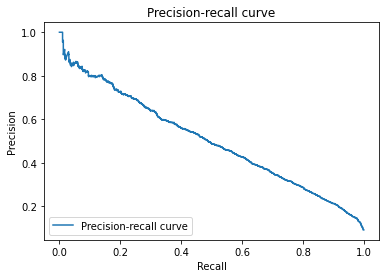

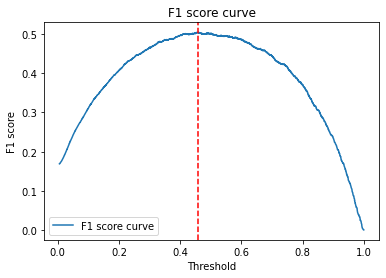

In [1438]:
precision, recall, thresholds_pr = precision_recall_curve( Y_train,y_proba_lr_test_thres[:,1])

# calculate F1 score for each threshold
f1_scores = 2 * (precision * recall) / (precision + recall)
optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds_pr[optimal_idx]


# plot precision-recall curve
plt.plot(recall, precision, label='Precision-recall curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-recall curve')
plt.legend(loc="lower left")
plt.show()

# plot F1 score curve
plt.plot(thresholds_pr, f1_scores[:-1], label='F1 score curve')
plt.axvline(x=optimal_threshold, color='r', linestyle='--')
plt.xlabel('Threshold')
plt.ylabel('F1 score')
plt.title('F1 score curve')
plt.legend(loc="lower left")
plt.show()

In [1443]:
Y_predict_thres_test_prob = lr_test_thres.predict_proba(X_test)[:,1]

In [1444]:
Y_predict_lr_thres_test = Y_predict_thres_test_prob>=optimal_threshold

In [1446]:
confusion_matrix(Y_test,Y_predict_lr_thres_test)

array([[4668,  384],
       [ 228,  279]], dtype=int64)

In [1471]:
print('TEST CLASSIFICATION REPORT:\n')
print(classification_report(Y_test,Y_predict_lr_thres_test))

TEST CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.95      0.92      0.94      5052
           1       0.42      0.55      0.48       507

    accuracy                           0.89      5559
   macro avg       0.69      0.74      0.71      5559
weighted avg       0.90      0.89      0.90      5559



In [1451]:
Y_predict_lr_thres_test_train = y_proba_lr_test_thres[:,1]>=optimal_threshold

In [1461]:
print('TRAINING CLASSIFICATION REPORT:\n')
print(classification_report(Y_train,Y_predict_lr_thres_test_train))

TRAINING CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.96      0.93      0.94     20207
           1       0.45      0.56      0.50      2029

    accuracy                           0.90     22236
   macro avg       0.70      0.75      0.72     22236
weighted avg       0.91      0.90      0.90     22236



In [1453]:
#With the above technique, we can choose the threshold according to our evaluation metric. Here I chose F1 score. 
#And the results are pretty similar.

In [125]:
#As we can see in the above models, we couldn't get F1 score above 50 for the y=1 label.
#Let's try XGBoost.

In [688]:
#We are splitting the training data itself into 80-20% to pass a set of training data to the XGBoost.
#It can take a validation dataset and at each iteration, it checks the evaluation metric for the validation data 
#and will stop the iteration once there is no longer imrpovement in the validation metric
X_train_xg_fit,X_train_xg_val,Y_train_xg_fit,Y_train_xg_val=train_test_split(X_train,Y_train,test_size=0.2,random_state=100,stratify=Y_train)

In [668]:
xg_base_model = XGBClassifier(random_state = 55)
xg_base_res = xg_base_model.fit(X_train_xg_fit,Y_train_xg_fit)

In [669]:
Y_xg_base_predict = xg_base_res.predict(X_test)

In [670]:
confusion_matrix(Y_test,Y_xg_base_predict)

array([[4938,  114],
       [ 342,  165]], dtype=int64)

In [1472]:
print('TEST CLASSIFICATION REPORT:\n')
print(classification_report(Y_test,Y_xg_base_predict))

TEST CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.94      0.98      0.96      5052
           1       0.59      0.33      0.42       507

    accuracy                           0.92      5559
   macro avg       0.76      0.65      0.69      5559
weighted avg       0.90      0.92      0.91      5559



In [720]:
xg_params = {'scale_pos_weight':[10, 25, 50, 75, 99, 100, 1000],
             'max_depth': [4, 8, 16, 32, 64, None]
            }

In [721]:
gsc_xg = GridSearchCV(estimator= xg_base_model, param_grid= xg_params, cv = 3, n_jobs= -1, scoring= 'f1')
gsc_xg_res = gsc_xg.fit(X_train_xg_fit,Y_train_xg_fit)

print(f'Best Parameters using Grid Search: {gsc_xg_res.best_params_}')
print(f'Best Score: {gsc_xg_res.best_score_}')

Best Parameters using Grid Search: {'max_depth': 32, 'scale_pos_weight': 99}
Best Score: 0.4879753078186664


In [844]:
#Early Stopping parameter helps us in preventing Overfitting
xg_model_1 = XGBClassifier(scale_pos_weight = 99, n_estimators = 500, learning_rate = 0.1,max_depth = 32, verbosity = 1, random_state = 55)
xg_model_1_res = xg_model_1.fit(X_train_xg_fit,Y_train_xg_fit, eval_set=[(X_train_xg_val,Y_train_xg_val)],early_stopping_rounds=20)

[0]	validation_0-logloss:0.64614
[1]	validation_0-logloss:0.60742
[2]	validation_0-logloss:0.57449
[3]	validation_0-logloss:0.54766
[4]	validation_0-logloss:0.52340
[5]	validation_0-logloss:0.50145
[6]	validation_0-logloss:0.48298
[7]	validation_0-logloss:0.46444
[8]	validation_0-logloss:0.44825
[9]	validation_0-logloss:0.43398
[10]	validation_0-logloss:0.42180
[11]	validation_0-logloss:0.40909
[12]	validation_0-logloss:0.40038
[13]	validation_0-logloss:0.38898
[14]	validation_0-logloss:0.37836
[15]	validation_0-logloss:0.36854
[16]	validation_0-logloss:0.35905
[17]	validation_0-logloss:0.35174
[18]	validation_0-logloss:0.34387
[19]	validation_0-logloss:0.33733
[20]	validation_0-logloss:0.33137
[21]	validation_0-logloss:0.32603
[22]	validation_0-logloss:0.32097
[23]	validation_0-logloss:0.31638
[24]	validation_0-logloss:0.31194
[25]	validation_0-logloss:0.30852
[26]	validation_0-logloss:0.30484
[27]	validation_0-logloss:0.30142
[28]	validation_0-logloss:0.29803
[29]	validation_0-loglos

In [845]:
Y_predict_xg_1 = xg_model_1_res.predict(X_test)

In [846]:
confusion_matrix(Y_test,Y_predict_xg_1)

array([[4753,  299],
       [ 270,  237]], dtype=int64)

In [1473]:
print('TEST CLASSIFICATION REPORT:\n')
print(classification_report(Y_test,Y_predict_xg_1))

TEST CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.95      0.94      0.94      5052
           1       0.44      0.47      0.45       507

    accuracy                           0.90      5559
   macro avg       0.69      0.70      0.70      5559
weighted avg       0.90      0.90      0.90      5559



In [848]:
Y_predict_xg_1_train = xg_model_1_res.predict(X_train_xg_val)

In [849]:
confusion_matrix(Y_train_xg_val,Y_predict_xg_1_train)

array([[3807,  235],
       [ 217,  189]], dtype=int64)

In [1460]:
print('TRAINING CLASSIFICATION REPORT:\n')
print(classification_report(Y_train_xg_val,Y_predict_xg_1_train))

TRAINING CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.95      0.94      0.94      4042
           1       0.45      0.47      0.46       406

    accuracy                           0.90      4448
   macro avg       0.70      0.70      0.70      4448
weighted avg       0.90      0.90      0.90      4448



In [861]:
#Manualling tuning some parameters and seeing the results
xg_model_2 = XGBClassifier(scale_pos_weight = 1000,n_estimators = 500, learning_rate = 0.1, max_depth = 128, verbosity = 1, random_state = 55)
xg_model_2.fit(X_train_xg_fit,Y_train_xg_fit, eval_set=[(X_train_xg_val,Y_train_xg_val)],early_stopping_rounds=30)

[0]	validation_0-logloss:0.66126
[1]	validation_0-logloss:0.63558
[2]	validation_0-logloss:0.60878
[3]	validation_0-logloss:0.58595
[4]	validation_0-logloss:0.56946
[5]	validation_0-logloss:0.55524
[6]	validation_0-logloss:0.54543
[7]	validation_0-logloss:0.53247
[8]	validation_0-logloss:0.51984
[9]	validation_0-logloss:0.51059
[10]	validation_0-logloss:0.50324
[11]	validation_0-logloss:0.49432
[12]	validation_0-logloss:0.48645
[13]	validation_0-logloss:0.47890
[14]	validation_0-logloss:0.47020
[15]	validation_0-logloss:0.46336
[16]	validation_0-logloss:0.45598
[17]	validation_0-logloss:0.45076
[18]	validation_0-logloss:0.44714
[19]	validation_0-logloss:0.44116
[20]	validation_0-logloss:0.43795
[21]	validation_0-logloss:0.43465
[22]	validation_0-logloss:0.43023
[23]	validation_0-logloss:0.42752
[24]	validation_0-logloss:0.42402
[25]	validation_0-logloss:0.42093
[26]	validation_0-logloss:0.41900
[27]	validation_0-logloss:0.41643
[28]	validation_0-logloss:0.41256
[29]	validation_0-loglos

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=128, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=500, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=55, ...)

In [862]:
Y_predict_xg_2 = xg_model_2.predict(X_test)

In [863]:
confusion_matrix(Y_test,Y_predict_xg_2)

array([[4718,  334],
       [ 248,  259]], dtype=int64)

In [1474]:
print('TEST CLASSIFICATION REPORT:\n')
print(classification_report(Y_test,Y_predict_xg_2))

TEST CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.95      0.93      0.94      5052
           1       0.44      0.51      0.47       507

    accuracy                           0.90      5559
   macro avg       0.69      0.72      0.71      5559
weighted avg       0.90      0.90      0.90      5559



In [865]:
Y_predict_xg_2_train = xg_model_2.predict(X_train_xg_val)

In [1459]:
print('TRAINING CLASSIFICATION REPORT:\n')
print(classification_report(Y_train_xg_val,Y_predict_xg_2_train))

TRAINING CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.95      0.94      0.95      4042
           1       0.46      0.49      0.48       406

    accuracy                           0.90      4448
   macro avg       0.71      0.72      0.71      4448
weighted avg       0.90      0.90      0.90      4448



In [919]:
print('BEFORE BALANCING THE DATSET:\nTEST DATASET RESULTS')
print(f'XG BOOST:\n {classification_report(Y_test,Y_predict_xg_2)}')
print(f'LOGISTIC REGRESSION:\n {classification_report(Y_test,Y_predict_lr_1)}')
print(f'RANDOM FOREST:\n {classification_report(Y_test,Y_predict_rf_2)}')

BEFORE BALANCING THE DATSET:
TEST DATASET RESULTS
XG BOOST:
               precision    recall  f1-score   support

           0       0.95      0.93      0.94      5052
           1       0.44      0.51      0.47       507

    accuracy                           0.90      5559
   macro avg       0.69      0.72      0.71      5559
weighted avg       0.90      0.90      0.90      5559

LOGISTIC REGRESSION:
               precision    recall  f1-score   support

           0       0.95      0.94      0.94      5052
           1       0.45      0.51      0.48       507

    accuracy                           0.90      5559
   macro avg       0.70      0.73      0.71      5559
weighted avg       0.91      0.90      0.90      5559

RANDOM FOREST:
               precision    recall  f1-score   support

           0       0.95      0.93      0.94      5052
           1       0.45      0.55      0.49       507

    accuracy                           0.90      5559
   macro avg       0.70      

In [920]:
print('BEFORE BALANCING THE DATSET:\nTRAIN DATASET RESULTS')
print(f'XG BOOST:\n {classification_report(Y_train_xg_val,Y_predict_xg_2_train)}')
print(f'LOGISTIC REGRESSION:\n {classification_report(Y_train,Y_predict_lr_1_train)}')
print(f'RANDOM FOREST:\n {classification_report(Y_train,Y_pred_train_rf_2)}')

BEFORE BALANCING THE DATSET:
TRAIN DATASET RESULTS
XG BOOST:
               precision    recall  f1-score   support

           0       0.95      0.94      0.95      4042
           1       0.46      0.49      0.48       406

    accuracy                           0.90      4448
   macro avg       0.71      0.72      0.71      4448
weighted avg       0.90      0.90      0.90      4448

LOGISTIC REGRESSION:
               precision    recall  f1-score   support

           0       0.95      0.94      0.95     20207
           1       0.48      0.53      0.50      2029

    accuracy                           0.90     22236
   macro avg       0.71      0.73      0.72     22236
weighted avg       0.91      0.90      0.91     22236

RANDOM FOREST:
               precision    recall  f1-score   support

           0       0.96      0.94      0.95     20207
           1       0.52      0.64      0.57      2029

    accuracy                           0.91     22236
   macro avg       0.74     

In [921]:
#As you can see from the above details, the best f1 score we could get is 0.50. And No overfitting problem. 
#We couldnt get good accuracy due to the imbalance nature of the datset.

In [1430]:
for model in[rf_model_2,lr_model_1,xg_model_2]:
    print("======="*5)
    print("Performance of",model)
    print("======="*5)
    cv=StratifiedShuffleSplit(n_splits=10,test_size=0.25,random_state=50)
    scoring=["f1_macro","precision_macro","recall_macro"]
    cross_val_scores=cross_validate(model,x_scaled,y,scoring=scoring,cv=cv)
    f1_test_cv=round(cross_val_scores["test_f1_macro"].mean(),4)
    precisio_test_cv=round(cross_val_scores["test_precision_macro"].mean(),4)
    Recall_test_cv=round(cross_val_scores["test_recall_macro"].mean(),4)
    
    # print of metrics
    print("F1 MACRO",f1_test_cv) 
    print("PRECISION MACRO",precisio_test_cv) 
    print("RECALL MACRO",Recall_test_cv) 


Performance of RandomForestClassifier(class_weight={1: 5}, max_depth=7, min_samples_split=30,
                       n_estimators=50, random_state=55)
F1 MACRO 0.7192
PRECISION MACRO 0.7015
RECALL MACRO 0.7427
Performance of LogisticRegression(class_weight={1: 3}, random_state=55)
F1 MACRO 0.7182
PRECISION MACRO 0.7097
RECALL MACRO 0.728
Performance of XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=128, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_es

In [90]:
#The above ouput gives us an indication of how the performs on the whole datset

In [922]:
#We can try balancing the data and do the prediction.

In [94]:
#Many methods are available but here we use a combination of SMOTE and RANdomUnderSampler. 
#Apparaently, the combination of two gives us good results.
smote=SMOTE(sampling_strategy=0.75)
rus = RandomUnderSampler(sampling_strategy=0.9)

In [95]:
Y_train.value_counts()

0    20207
1     2029
Name: septic_shock, dtype: int64

In [96]:
#We only balance our training dataset
X_train_smote,Y_train_smote=smote.fit_resample(X_train,Y_train)

In [97]:
X_train_sm, Y_train_sm = rus.fit_resample(X_train_smote,Y_train_smote)

In [98]:
Y_train_smote.value_counts()

0    20207
1    15155
Name: septic_shock, dtype: int64

In [99]:
Y_train_sm.value_counts()

0    16838
1    15155
Name: septic_shock, dtype: int64

In [1283]:
#Now we'll train our models on this dataset.

In [1284]:
rf_base_smote_model = RandomForestClassifier(random_state=55)
rf_base_smote_model_res = rf_base_smote_model.fit(X_train_sm,Y_train_sm)

In [1285]:
Y_predict_rf_smote_base = rf_base_smote_model_res.predict(X_test)

In [1286]:
confusion_matrix(Y_test,Y_predict_rf_smote_base)

array([[4772,  280],
       [ 273,  234]], dtype=int64)

In [1475]:
print('TEST CLASSIFICATION REPORT:\n')
print(classification_report(Y_test,Y_predict_rf_smote_base))

TEST CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.95      0.94      0.95      5052
           1       0.46      0.46      0.46       507

    accuracy                           0.90      5559
   macro avg       0.70      0.70      0.70      5559
weighted avg       0.90      0.90      0.90      5559



In [1288]:
Y_predict_rf_smote_base_train = rf_base_smote_model_res.predict(X_train_sm)

In [1458]:
print('TRAINING CLASSIFICATION REPORT:\n')
print(classification_report(Y_train_sm,Y_predict_rf_smote_base_train))

TRAINING CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     16838
           1       1.00      1.00      1.00     15155

    accuracy                           1.00     31993
   macro avg       1.00      1.00      1.00     31993
weighted avg       1.00      1.00      1.00     31993



In [1319]:
parameters_to_tune = {'max_depth': [2, 4, 8, 16, 32, 64],
                      'min_samples_split': [50,300, 900, 1500, 3000],
                      'n_estimators': [50,100,500]
                     }

In [1090]:
gsc_rf_smote = GridSearchCV(estimator= base_rf_model, param_grid= parameters_to_tune, cv = 3, n_jobs= -1, scoring= 'f1')

gsc_rf_res_smote = gsc_rf_smote.fit(X_train_smote,Y_train_smote)

print(f'Best Parameters using Grid Search: {gsc_rf_res_smote.best_params_}')
print(f'Best Score: {gsc_rf_res_smote.best_score_}')

Best Parameters using Grid Search: {'max_depth': 64, 'min_samples_split': 50, 'n_estimators': 500}
Best Score: 0.9267136597604623


In [1327]:
rf_smote_grid_model_1 = RandomForestClassifier(n_estimators=500,max_depth=64,min_samples_split=50,random_state=55)

In [1328]:
rf_smote_grid_model_1.fit(X_train_sm,Y_train_sm)

RandomForestClassifier(max_depth=64, min_samples_split=50, n_estimators=500,
                       random_state=55)

In [1329]:
Y_predict_rf_smote_grid_model_1 = rf_smote_grid_model_1.predict(X_test)

In [1330]:
confusion_matrix(Y_test,Y_predict_rf_smote_grid_model_1)

array([[4670,  382],
       [ 233,  274]], dtype=int64)

In [1476]:
print('TEST CLASSIFICATION REPORT:\n')
print(classification_report(Y_test,Y_predict_rf_smote_grid_model_1))

TEST CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.95      0.92      0.94      5052
           1       0.42      0.54      0.47       507

    accuracy                           0.89      5559
   macro avg       0.69      0.73      0.70      5559
weighted avg       0.90      0.89      0.90      5559



In [1332]:
Y_predict_train_rf_smote_grid_model_1 = rf_smote_grid_model_1.predict(X_train_sm)

In [1457]:
print('TRAINING CLASSIFICATION REPORT:\n')
print(classification_report(Y_train_sm,Y_predict_train_rf_smote_grid_model_1))

TRAINING CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.97      0.98      0.97     16838
           1       0.97      0.97      0.97     15155

    accuracy                           0.97     31993
   macro avg       0.97      0.97      0.97     31993
weighted avg       0.97      0.97      0.97     31993



In [1334]:
#Let's try to resolve this overfit issue:

In [136]:
rf_smote_grid_model_2 = RandomForestClassifier(n_estimators=500,max_depth=8,min_samples_split=100,
                                               min_impurity_decrease=0.09,max_features=8,max_samples =0.5, random_state=55)

In [137]:
rf_smote_grid_model_2.fit(X_train_sm,Y_train_sm)

RandomForestClassifier(max_depth=8, max_features=8, max_samples=0.5,
                       min_impurity_decrease=0.09, min_samples_split=100,
                       n_estimators=500, random_state=55)

In [138]:
Y_predict_rf_grid_model_2 = rf_smote_grid_model_2.predict(X_test)

In [139]:
confusion_matrix(Y_test,Y_predict_rf_grid_model_2)

array([[4263,  789],
       [ 207,  300]], dtype=int64)

In [140]:
print('TEST CLASSIFICATION REPORT:\n')
print(classification_report(Y_test,Y_predict_rf_grid_model_2))

TEST CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.95      0.84      0.90      5052
           1       0.28      0.59      0.38       507

    accuracy                           0.82      5559
   macro avg       0.61      0.72      0.64      5559
weighted avg       0.89      0.82      0.85      5559



In [141]:
Y_predict_train_rf_smote_grid_model_2 = rf_smote_grid_model_2.predict(X_train_sm)

In [142]:
print('TRAINING CLASSIFICATION REPORT:\n')
print(classification_report(Y_train_sm,Y_predict_train_rf_smote_grid_model_2))

TRAINING CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.74      0.85      0.80     16838
           1       0.81      0.67      0.73     15155

    accuracy                           0.77     31993
   macro avg       0.78      0.76      0.76     31993
weighted avg       0.77      0.77      0.77     31993



In [107]:
#SLightly can adress the overfitting issue. But still couldn't get it too well on the test data.

In [108]:
knn_base_model = KNeighborsClassifier()  
knn_base_model_res = knn_base_model.fit(X_train_sm, Y_train_sm)  

In [109]:
Y_predict_knn_smote_base = knn_base_model_res.predict(X_test)

In [110]:
confusion_matrix(Y_test,Y_predict_knn_smote_base)

array([[3816, 1236],
       [ 163,  344]], dtype=int64)

In [111]:
print('TEST CLASSIFICATION REPORT:\n')
print(classification_report(Y_test,Y_predict_knn_smote_base))

TEST CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.96      0.76      0.85      5052
           1       0.22      0.68      0.33       507

    accuracy                           0.75      5559
   macro avg       0.59      0.72      0.59      5559
weighted avg       0.89      0.75      0.80      5559



In [112]:
Y_predict_knn_smote_base_train = knn_base_model_res.predict(X_train_sm)

In [113]:
print('TRAINING CLASSIFICATION REPORT:\n')
print(classification_report(Y_train_sm,Y_predict_knn_smote_base_train))

TRAINING CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       1.00      0.82      0.90     16838
           1       0.83      1.00      0.91     15155

    accuracy                           0.91     31993
   macro avg       0.92      0.91      0.91     31993
weighted avg       0.92      0.91      0.91     31993



In [98]:
mean_acc = np.zeros(20)
c=0
for i in range(1,41,2):
    #Train Model and Predict
    c+=1
    knn = KNeighborsClassifier(n_neighbors = i).fit(X_train_sm,Y_train_sm)
    yhat= knn.predict(X_test)
    mean_acc[i-c] = f1_score(Y_test, yhat)

mean_acc

array([0.32990937, 0.32625583, 0.3296598 , 0.32827586, 0.32510103,
       0.32612457, 0.31899791, 0.31369295, 0.31288596, 0.31777232,
       0.31626016, 0.31583199, 0.31770412, 0.31761387, 0.31523924,
       0.31608731, 0.3141824 , 0.31185362, 0.31128713, 0.31237643])

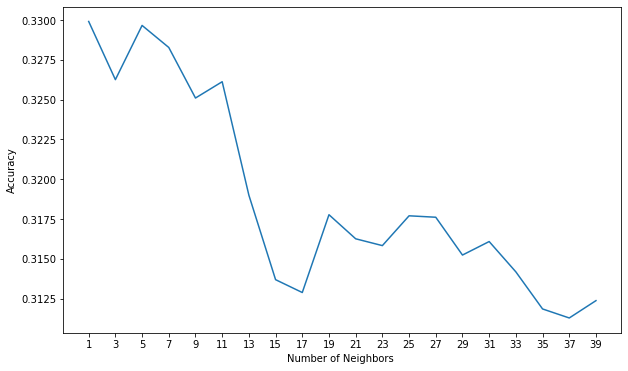

In [99]:
loc = np.arange(1,41,step=2.0)
plt.figure(figsize = (10, 6))
plt.plot(range(1,41,2), mean_acc)
plt.xticks(loc)
plt.xlabel('Number of Neighbors ')
plt.ylabel('Accuracy')
plt.show()

In [1303]:
#As we can see, changing the n_neighbours and other parameters doesn't increase f1_score. Yes recall is higher. 
#But precision is lowwer. We might use it according to our needs

In [1304]:
xg_base_model_smote = XGBClassifier(random_state=55)
xg_base_model_smote_res = xg_base_model_smote.fit(X_train_sm,Y_train_sm)

In [1480]:
Y_predict_smote_xg = xg_base_model_smote_res.predict(X_test)

In [1481]:
confusion_matrix(Y_test,Y_predict_smote_xg)

array([[4872,  180],
       [ 307,  200]], dtype=int64)

In [1482]:
print('TEST CLASSIFICATION REPORT:\n')
print(classification_report(Y_test,Y_predict_smote_xg))

TEST CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.94      0.96      0.95      5052
           1       0.53      0.39      0.45       507

    accuracy                           0.91      5559
   macro avg       0.73      0.68      0.70      5559
weighted avg       0.90      0.91      0.91      5559



In [1483]:
Y_predict_smote_xg_train = xg_base_model_smote_res.predict(X_train_sm)

In [1484]:
print('TRAINING CLASSIFICATION REPORT:\n')
print(classification_report(Y_train_sm,Y_predict_smote_xg_train))

TRAINING CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.99      1.00      1.00     16838
           1       1.00      0.99      0.99     15155

    accuracy                           0.99     31993
   macro avg       1.00      0.99      0.99     31993
weighted avg       0.99      0.99      0.99     31993



In [114]:
X_train_sm_xg,X_val_sm_xg,Y_train_sm_xg,Y_val_sm_xg = train_test_split(X_train_sm,Y_train_sm,test_size=0.20,stratify=Y_train_sm)

In [115]:
xg_model_smote_1 = XGBClassifier(n_estimators = 500, learning_rate = 0.1, max_depth = 32, verbosity = 1, random_state = 55)
xg_model_smote_1.fit(X_train_sm_xg,Y_train_sm_xg, eval_set=[(X_val_sm_xg,Y_val_sm_xg)],early_stopping_rounds=30)

[0]	validation_0-logloss:0.62283
[1]	validation_0-logloss:0.56436
[2]	validation_0-logloss:0.51555
[3]	validation_0-logloss:0.47325
[4]	validation_0-logloss:0.43655
[5]	validation_0-logloss:0.40552
[6]	validation_0-logloss:0.37782
[7]	validation_0-logloss:0.35408
[8]	validation_0-logloss:0.33258
[9]	validation_0-logloss:0.31373
[10]	validation_0-logloss:0.29683
[11]	validation_0-logloss:0.28191
[12]	validation_0-logloss:0.26788
[13]	validation_0-logloss:0.25573
[14]	validation_0-logloss:0.24374
[15]	validation_0-logloss:0.23381
[16]	validation_0-logloss:0.22451
[17]	validation_0-logloss:0.21621
[18]	validation_0-logloss:0.20819
[19]	validation_0-logloss:0.20122
[20]	validation_0-logloss:0.19519
[21]	validation_0-logloss:0.18956
[22]	validation_0-logloss:0.18471
[23]	validation_0-logloss:0.17987
[24]	validation_0-logloss:0.17527
[25]	validation_0-logloss:0.17117
[26]	validation_0-logloss:0.16737
[27]	validation_0-logloss:0.16388
[28]	validation_0-logloss:0.16082
[29]	validation_0-loglos

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=32, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=500, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=55, ...)

In [116]:
Y_pred_smote_xg_1 = xg_model_smote_1.predict(X_test)

In [117]:
confusion_matrix(Y_test,Y_pred_smote_xg_1)

array([[4870,  182],
       [ 289,  218]], dtype=int64)

In [118]:
print('TEST CLASSIFICATION REPORT:\n')
print(classification_report(Y_test,Y_pred_smote_xg_1))

TEST CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.94      0.96      0.95      5052
           1       0.55      0.43      0.48       507

    accuracy                           0.92      5559
   macro avg       0.74      0.70      0.72      5559
weighted avg       0.91      0.92      0.91      5559



In [119]:
Y_pred_smote_xg_1_train = xg_model_smote_1.predict(X_val_sm_xg)

In [120]:
print('TRAINING CLASSIFICATION REPORT:\n')
print(classification_report(Y_val_sm_xg,Y_pred_smote_xg_1_train))

TRAINING CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.96      0.97      0.96      3368
           1       0.96      0.95      0.96      3031

    accuracy                           0.96      6399
   macro avg       0.96      0.96      0.96      6399
weighted avg       0.96      0.96      0.96      6399



In [143]:
print('AFTER BALANCING THE DATSET:\nTEST DATASET RESULTS')
print(f'XG BOOST:\n {classification_report(Y_test,Y_pred_smote_xg_1)}')
print(f'K-NEAREST NEIGHBOR:\n {classification_report(Y_test,Y_predict_knn_smote_base)}')
print(f'RANDOM FOREST:\n {classification_report(Y_test,Y_predict_rf_grid_model_2)}')

AFTER BALANCING THE DATSET:
TEST DATASET RESULTS
XG BOOST:
               precision    recall  f1-score   support

           0       0.94      0.96      0.95      5052
           1       0.55      0.43      0.48       507

    accuracy                           0.92      5559
   macro avg       0.74      0.70      0.72      5559
weighted avg       0.91      0.92      0.91      5559

K-NEAREST NEIGHBOR:
               precision    recall  f1-score   support

           0       0.96      0.76      0.85      5052
           1       0.22      0.68      0.33       507

    accuracy                           0.75      5559
   macro avg       0.59      0.72      0.59      5559
weighted avg       0.89      0.75      0.80      5559

RANDOM FOREST:
               precision    recall  f1-score   support

           0       0.95      0.84      0.90      5052
           1       0.28      0.59      0.38       507

    accuracy                           0.82      5559
   macro avg       0.61      0.

In [ ]:
#NOTE: KNN and XGBOOST might have overfitting problem. 
#In general using smote technique() leads us easily to overfitting problems

In [1429]:
for model in[rf_smote_grid_model_2,knn_base_model,xg_model_smote_1]:
    print("======="*5)
    print("Performance of",model)
    print("======="*5)
    cv=StratifiedShuffleSplit(n_splits=10,test_size=0.25,random_state=50)
    scoring=["f1_macro","precision_macro","recall_macro"]
    cross_val_scores=cross_validate(model,x_scaled,y,scoring=scoring,cv=cv)
    f1_test_cv=round(cross_val_scores["test_f1_macro"].mean(),4)
    precisio_test_cv=round(cross_val_scores["test_precision_macro"].mean(),4)
    Recall_test_cv=round(cross_val_scores["test_recall_macro"].mean(),4)
    
    # print of metrics
    print("F1 MACRO",f1_test_cv) 
    print("PRECISION MACRO",precisio_test_cv) 
    print("RECALL MACRO",Recall_test_cv) 


Performance of RandomForestClassifier(max_depth=8, max_features=8, max_samples=0.5,
                       min_impurity_decrease=0.09, min_samples_split=100,
                       n_estimators=500, random_state=55)
F1 MACRO 0.4761
PRECISION MACRO 0.4544
RECALL MACRO 0.5
Performance of KNeighborsClassifier()
F1 MACRO 0.5867
PRECISION MACRO 0.7901
RECALL MACRO 0.5622
Performance of XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=32, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constrai

The above presented models are built on the basis to get high f1_score possible in this project. 
Generally in medical cases, we would like to give much importance to our recall in cases where 
Our False Positives wouldn't hurt much. (Precision_Recall TradeOff)

In [144]:
#The best we could achieve is around 0.5 f1 score, and we can tradeoff between precision and recall according to our needs.
#Recall-60 Precision-40 F1_score-50

There are 2 columns - apache_3j_bodysystem and apache_2_bodysystem which belong 
to this category. Both of them provide the admission diagnosis group for 
APACHE II and III, respectively.

APACHE or Acute Physiology and Chronic Health Evaluation is another ICU scoring 
system which provides information about the severity of disease and risk of 
deaths in the first 24 hours of patient's admission to an ICU. 
The range lies between 0 and 71 (integers), higher the number, 
greater the risk of death.

Since both columns are effectively APACHE columns, it can be expected that 
both of them have high correlation. The same is seen as per this report:

"Results: Both systems showed a significant association between higher scores 
and higher mortality. The APACHE II system under-predicted the actual hospital 
mortality rate. The APACHE III systems had a higher discriminative power 
(area 0.7462) than the APACHE II systems (area 0.6856; p < 0.05)."

This shows that APACHE III is a better score than APACHE II. Thus, whenever 
required, we will prefer APACHE III over APACHE II. This will also help in 
reducing multi-correlation between columns.